In [1]:
!pip install nltk
!pip install twython
!pip install textblob
!pip install wordcloud

Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
     -------------------------------------- 151.7/151.7 kB 1.8 MB/s eta 0:00:00
Defaulting to user installation because normal site-packages is not writeable
     -------------------------------------- 626.3/626.3 kB 2.3 MB/s eta 0:00:00
     ---------------------------------------- 1.5/1.5 MB 2.5 MB/s eta 0:00:00


  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.


Defaulting to user installation because normal site-packages is not writeable


In [1]:
#Exercice 11
import numpy as np 

np.random.seed(42)

tableau1 = np.random.randint(0, 10, (4, 4))  
tableau2 = np.random.randint(0, 10, (4, 4))  
tableau3 = np.random.randint(0, 10, (4, 4))  

# Placer les tableaux dans un autre tableau
tableaux = [tableau1, tableau2, tableau3]

# Empiler les tableaux en séquence horizontalement
empilement_horizontal = np.hstack(tableaux)

# Empiler les tableaux en séquence verticalement
empilement_vertical = np.vstack(tableaux)

# Afficher les résultats
print("Voici le Tableau 1 :\n", tableau1)
print("Voici Tableau 2 :\n", tableau2)
print("voici Tableau 3 :\n", tableau3)
print("\nj'empile_tout_doucement _ horizontal :\n", empilement_horizontal)
print("\nj'empile_tout_doucement_vertical :\n", empilement_vertical)

Voici le Tableau 1 :
 [[6 3 7 4]
 [6 9 2 6]
 [7 4 3 7]
 [7 2 5 4]]
Voici Tableau 2 :
 [[1 7 5 1]
 [4 0 9 5]
 [8 0 9 2]
 [6 3 8 2]]
voici Tableau 3 :
 [[4 2 6 4]
 [8 6 1 3]
 [8 1 9 8]
 [9 4 1 3]]

j'empile_tout_doucement _ horizontal :
 [[6 3 7 4 1 7 5 1 4 2 6 4]
 [6 9 2 6 4 0 9 5 8 6 1 3]
 [7 4 3 7 8 0 9 2 8 1 9 8]
 [7 2 5 4 6 3 8 2 9 4 1 3]]

j'empile_tout_doucement_vertical :
 [[6 3 7 4]
 [6 9 2 6]
 [7 4 3 7]
 [7 2 5 4]
 [1 7 5 1]
 [4 0 9 5]
 [8 0 9 2]
 [6 3 8 2]
 [4 2 6 4]
 [8 6 1 3]
 [8 1 9 8]
 [9 4 1 3]]


In [ ]:
import pandas as pd
import holidays

# Initialisation du calendrier des jours fériés français pour l'année 2023
fr_holidays = holidays.France(years=2023)

# Fonction qui prend une ligne du DataFrame et calcule les jours ouvrés avant 01/01/2023
def calculate_working_days_before_2023(ligne):
    # Date de référence : 01/01/2023
    start_date = pd.to_datetime("2023-01-01")
    
    # Date d'entrée du collaborateur dans la société
    entry_date = pd.to_datetime(ligne['date_entree_ste'])
    
    # Si la date d'entrée est après le 01/01/2023, renvoyer 0 (car il n'y a pas de jours ouvrés avant 2023)
    if entry_date >= start_date:
        return 0
    
    # Générer la plage de dates entre la date d'entrée et le 31/12/2022 (avant 01/01/2023)
    total_days = pd.date_range(start=entry_date, end=start_date - pd.Timedelta(days=1), freq='D')
    
    # Filtrer pour ne garder que les jours ouvrés (exclure les week-ends et les jours fériés)
    working_days = [day for day in total_days if day.weekday() < 5 and day not in fr_holidays]
    
    # Retourner le nombre de jours ouvrés avant 2023
    return len(working_days)

# Exemple de données avec des dates d'entrée avant 2023
data = {
    'matricule': [101, 102, 103],
    'date_entree_ste': ['2022-11-01', '2021-09-15', '2022-12-15'],  # Dates d'entrée avant 01/01/2023
}

# Créer le DataFrame
df = pd.DataFrame(data)

# Appliquer la fonction sur chaque ligne pour calculer les jours ouvrés avant 2023
df['jours_non_travailles_2023'] = df.apply(calculate_working_days_before_2023, axis=1)

# Afficher les résultats
print(df)


In [3]:
!pip install workalendar


Defaulting to user installation because normal site-packages is not writeable
     ------------------------------------ 210.7/210.7 kB 493.6 kB/s eta 0:00:00
     ---------------------------------------- 47.9/47.9 kB 2.4 MB/s eta 0:00:00
     ---------------------------------------- 5.8/5.8 MB 3.8 MB/s eta 0:00:00
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Created wheel for pymeeus: filename=PyMeeus-0.5.12-py3-none-any.whl size=732001 sha256=c90391e49082887b79d5d3de9c15c4e8ccfd01be3f345043dc63553c78959b40
  Stored in directory: c:\users\poste\appdata\local\pip\cache\wheels\04\1f\e5\8dd0c661cd8d252817655dc14a84f7ae045d6616594145aa81
Successfully built pymeeus


  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.


In [2]:
import pandas as pd
import numpy as np
from datetime import datetime, timedelta
from workalendar.europe import France  # Importation de workalendar pour la France
import seaborn as sns
import matplotlib.pyplot as plt

# Charger les données (remplacez 'path_to_your_file.csv' par le chemin réel de votre fichier)
#df = pd.read_csv('path_to_your_file.csv', parse_dates=['debut', 'fin'], dayfirst=True)

# Définir la période d'analyse : du 1er janvier 2024 au 31 juillet 2024
date_debut_periode = pd.Timestamp('2024-01-01')
date_fin_periode = pd.Timestamp('2024-07-31')

# Initialiser le calendrier des jours fériés pour la France
cal = France()

# Fonction pour calculer les jours théoriques de travail (ouvrés) dans la période
def calculate_work_days(row, date_debut_periode, date_fin_periode):
    # Liste des jours dans la période
    all_days = pd.date_range(start=date_debut_periode, end=date_fin_periode, freq='D')
    
    # Calculer les jours ouvrés, en excluant les week-ends et jours fériés
    work_days = [day for day in all_days if cal.is_working_day(day)]
    
    return len(work_days)

# Appliquer la fonction pour chaque collaborateur
df['jours_travail_theorique'] = df.apply(lambda row: calculate_work_days(row, date_debut_periode, date_fin_periode), axis=1)

# Vérifier le résultat
print(df[['societe', 'jours_travail_theorique']].head())

# Calculer le taux d'absentéisme par entité
df_absenteisme_entite = df.groupby('societe').agg(
    total_jours_arret=('jours_arret', 'sum'),
    total_jours_travail_theorique=('jours_travail_theorique', 'sum')
).reset_index()

df_absenteisme_entite['taux_absenteisme'] = df_absenteisme_entite['total_jours_arret'] / df_absenteisme_entite['total_jours_travail_theorique'] * 100

# Visualiser le taux d'absentéisme par entité
plt.figure(figsize=(10, 6))
sns.barplot(x='societe', y='taux_absenteisme', data=df_absenteisme_entite, palette='Blues_d')

plt.title('Taux d\'absentéisme par entité (%)', fontsize=16)
plt.xlabel('Entité', fontsize=12)
plt.ylabel('Taux d\'absentéisme (%)', fontsize=12)

# Afficher le graphique
plt.show()


NameError: name 'df' is not defined

In [6]:
all_days = pd.date_range(start=date_debut_periode, end=date_fin_periode, freq='D')
all_days

DatetimeIndex(['2024-01-01', '2024-01-02', '2024-01-03', '2024-01-04',
               '2024-01-05', '2024-01-06', '2024-01-07', '2024-01-08',
               '2024-01-09', '2024-01-10',
               ...
               '2024-07-22', '2024-07-23', '2024-07-24', '2024-07-25',
               '2024-07-26', '2024-07-27', '2024-07-28', '2024-07-29',
               '2024-07-30', '2024-07-31'],
              dtype='datetime64[ns]', length=213, freq='D')

In [9]:
work_days = [day for day in all_days if cal.is_working_day(day)]
work_days

[Timestamp('2024-01-02 00:00:00', freq='D'),
 Timestamp('2024-01-03 00:00:00', freq='D'),
 Timestamp('2024-01-04 00:00:00', freq='D'),
 Timestamp('2024-01-05 00:00:00', freq='D'),
 Timestamp('2024-01-08 00:00:00', freq='D'),
 Timestamp('2024-01-09 00:00:00', freq='D'),
 Timestamp('2024-01-10 00:00:00', freq='D'),
 Timestamp('2024-01-11 00:00:00', freq='D'),
 Timestamp('2024-01-12 00:00:00', freq='D'),
 Timestamp('2024-01-15 00:00:00', freq='D'),
 Timestamp('2024-01-16 00:00:00', freq='D'),
 Timestamp('2024-01-17 00:00:00', freq='D'),
 Timestamp('2024-01-18 00:00:00', freq='D'),
 Timestamp('2024-01-19 00:00:00', freq='D'),
 Timestamp('2024-01-22 00:00:00', freq='D'),
 Timestamp('2024-01-23 00:00:00', freq='D'),
 Timestamp('2024-01-24 00:00:00', freq='D'),
 Timestamp('2024-01-25 00:00:00', freq='D'),
 Timestamp('2024-01-26 00:00:00', freq='D'),
 Timestamp('2024-01-29 00:00:00', freq='D'),
 Timestamp('2024-01-30 00:00:00', freq='D'),
 Timestamp('2024-01-31 00:00:00', freq='D'),
 Timestamp

In [10]:
from warnings import filterwarnings
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import nltk
import seaborn as sns
from PIL import Image
from nltk.corpus import stopwords
from nltk.sentiment import SentimentIntensityAnalyzer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score, GridSearchCV, cross_validate, train_test_split
from sklearn.metrics import classification_report
from sklearn.preprocessing import LabelEncoder
from textblob import Word, TextBlob
from wordcloud import WordCloud
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix

## Description des données:Projet de prediction ou classifier le sentiment d'un tweet .
La table contient des données textuelles associées à des sentiments exprimés sur les réseaux sociaux. Elle est sera utilisée pour entraîner et évaluer un modèle de classification de sentiment associé aux tweet.

La table comprend les colonnes suivantes :

1.target: Cette colonne représente la polarité du sentiment exprimé dans le texte. Elle peut prendre deux valeurs :

Valeur 0 : correspond à un sentiment négatif.

Valeur 4 : correspond à un sentiment positif.

2.ids: Identifiant unique associé à chaque enregistrement.

3.date: La date et l'heure de la publication du texte.

4.flag: Un marqueur indiquant la provenance des données. Il peut prendre les valeurs suivantes :

"NO_QUERY" : indique que les données ne proviennent pas d'une requête spécifique.
Autres valeurs : peuvent indiquer la requête ou l'origine des données.
5.user: Le nom d'utilisateur de l'auteur du texte.

6.text: Le texte du tweet ou du message exprimant le sentiment.

Cliquez ici pour accéder à la base de données.

In [11]:
# Importation de la base de données

columns = ['target','ids','date','flag','user','text']

df=pd.read_csv("twitter.csv", encoding='ISO-8859-1',names=columns)
df

,target,ids,date,flag,user,text
0,0,1467810369,Mon Apr 06 22:19:45 PDT 2009,NO_QUERY,_TheSpecialOne_,"@switchfoot http://twitpic.com/2y1zl - Awww, t..."
1,0,1467810672,Mon Apr 06 22:19:49 PDT 2009,NO_QUERY,scotthamilton,is upset that he can't update his Facebook by ...
2,0,1467810917,Mon Apr 06 22:19:53 PDT 2009,NO_QUERY,mattycus,@Kenichan I dived many times for the ball. Man...
3,0,1467811184,Mon Apr 06 22:19:57 PDT 2009,NO_QUERY,ElleCTF,my whole body feels itchy and like its on fire
4,0,1467811193,Mon Apr 06 22:19:57 PDT 2009,NO_QUERY,Karoli,"@nationwideclass no, it's not behaving at all...."
...,...,...,...,...,...,...
1599995,4,2193601966,Tue Jun 16 08:40:49 PDT 2009,NO_QUERY,AmandaMarie1028,Just woke up. Having no school is the best fee...
1599996,4,2193601969,Tue Jun 16 08:40:49 PDT 2009,NO_QUERY,TheWDBoards,TheWDB.com - Very cool to hear old Walt interv...
1599997,4,2193601991,Tue Jun 16 08:40:49 PDT 2009,NO_QUERY,bpbabe,Are you ready for your MoJo Makeover? Ask me f...
1599998,4,2193602064,Tue Jun 16 08:40:49 PDT 2009,NO_QUERY,tinydiamondz,Happy 38th Birthday to my boo of alll time!!! ...


In [7]:
#Avant toute chose ,toujours analyser la qualité de doonnées qu'on a.
#Pour cela :

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1600000 entries, 0 to 1599999
Data columns (total 6 columns):
 #   Column  Non-Null Count    Dtype 
---  ------  --------------    ----- 
 0   target  1600000 non-null  int64 
 1   ids     1600000 non-null  int64 
 2   date    1600000 non-null  object
 3   flag    1600000 non-null  object
 4   user    1600000 non-null  object
 5   text    1600000 non-null  object
dtypes: int64(2), object(4)
memory usage: 73.2+ MB


In [9]:
df.isnull().sum()

target    0
ids       0
date      0
flag      0
user      0
text      0
dtype: int64

In [10]:
#Selection de la target et du feature .
df=df[['target','text']]

In [19]:
df['target'].value_counts(),df['target'].unique(),df['target'].nunique(),

(0    800000
 4    800000
 Name: target, dtype: int64,
 array([0, 4], dtype=int64),
 2)

In [22]:
#Remplacer le 4 par 1 
df.loc[df['target']==4,'target']=1

df.target.unique()

array([0, 1], dtype=int64)

In [26]:
np.where?

In [27]:
#Analyse descriptive univariée 

In [50]:
target_counts=df['target'].value_counts()
#Calculer la proportion pour chaque valeur de la variable d'interet(target)

target_proportions=df['target'].value_counts(normalize=True)
target_proportions

0    0.5
1    0.5
Name: target, dtype: float64

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


([<matplotlib.axis.XTick at 0x2359a2e03d0>,
 [Text(0, 0, 'Négatif'), Text(1, 0, 'Positif')])

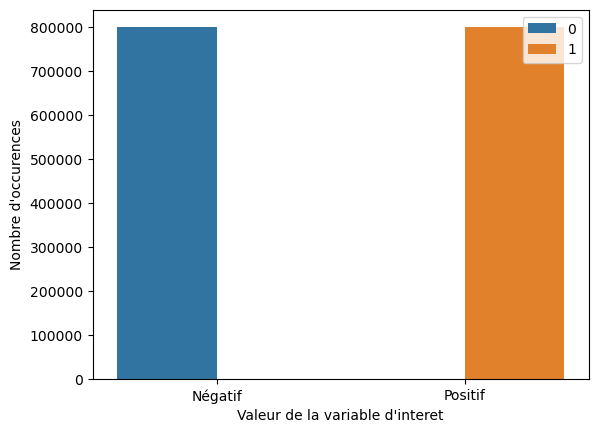

In [56]:
sns.barplot(target_counts.index,target_counts.values,hue=[0,1])
plt.xlabel("Valeur de la variable d'interet")
plt.ylabel("Nombre d'occurences")
# Ajouter une légende aux barres
plt.xticks(target_counts.index, ['Négatif', 'Positif'])
#plt.plot(target_counts.index,target_counts.values)

In [52]:
target_counts.index
target_counts.values


array([800000, 800000], dtype=int64)

([<matplotlib.axis.XTick at 0x2359e83f3d0>,
 [Text(0, 0, 'Négatif'), Text(1, 0, 'Positif')])

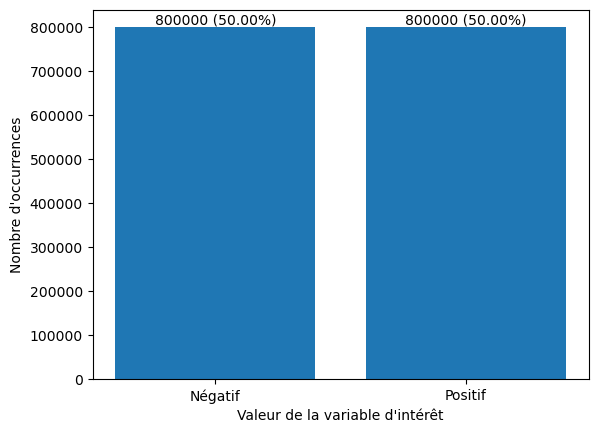

In [60]:


# Créer un graphique à barres pour visualiser la distribution
plt.bar(target_counts.index, target_counts.values)

# Ajouter les étiquettes des barres (nombre d'occurrences et proportion)
for i, count in enumerate(target_counts):
    proportion = target_proportions[i]
    plt.text(i, count, f"{count} ({proportion:.2%})", ha='center', va='bottom')

# Étiqueter l'axe des x et y
plt.xlabel('Valeur de la variable d\'intérêt')
plt.ylabel('Nombre d\'occurrences')

# Ajouter une légende aux barres
plt.xticks(target_counts.index, ['Négatif', 'Positif'])


In [79]:
#Selection aléatoirement de 10000 tweets positif

tweets_positifs=df[df['target']==1].sample(n=10000,random_state=42)

#Selection aléatoirement de 10000 tweets negatif

tweets_negatifs=df[df['target']==0].sample(n=10000,random_state=42)

#Concatenation de 2 sous base de données .
df_new=pd.concat([tweets_positifs,tweets_negatifs])

In [73]:
df_new.target.unique()

array([1, 0], dtype=int64)

In [82]:
#A essayer de comprendre plus tard
#k=pd.merge(tweets_positifs,tweets_negatifs,how='inner')

In [84]:
#Renitialiser les index

df_new=df_new.reset_index(drop=True)

In [85]:
df_new

,target,text
0,1,Is lookin 4ward to a long weekend really dont...
1,1,#myweakness Is music and i live to meet the p...
2,1,figured out the Internet on my new iPod
3,1,@hillsongunited can't wait to worship with you...
4,1,@sillybeggar Congrats James !! I'm sure the bo...
...,...,...
19995,0,really hates that they are totally messing up ...
19996,0,@BrownSuga3000 THANX FOR TELLING ME!!
19997,0,really sad that graduation is coming so fast.....
19998,0,Raining cats n dogs.


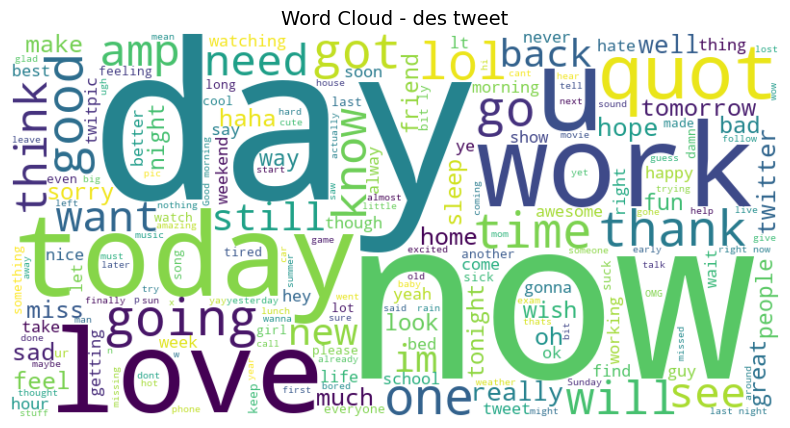

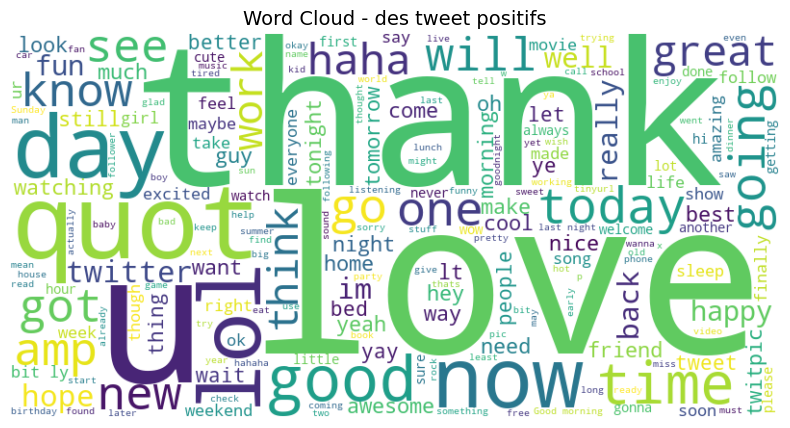

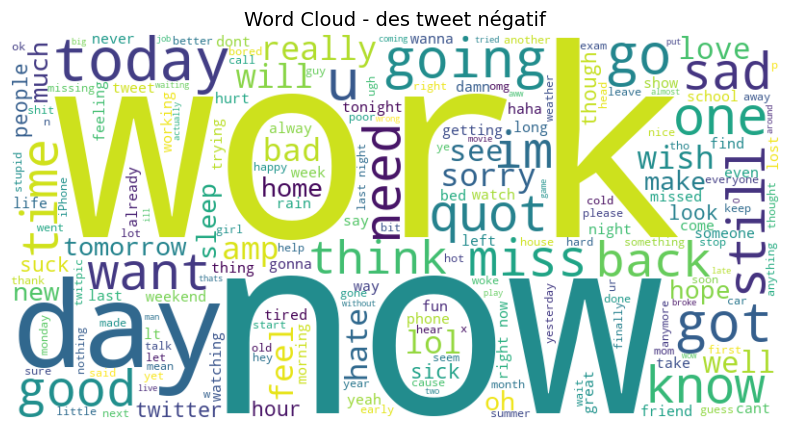

In [103]:
#Fonction pour generer le wordcloud :Description des tweets
def generer_wordcloud(tweets, titre):
    tout_texte = ' '.join(tweets)
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(tout_texte)
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(titre, fontsize=14)
    plt.axis('off')
    plt.show()

# Générer le word cloud pour chaque type de sentiment
generer_wordcloud(df_new['text'], 'Word Cloud - des tweet')
generer_wordcloud(tweets_positifs['text'], 'Word Cloud - des tweet positifs')
generer_wordcloud(tweets_negatifs['text'], 'Word Cloud - des tweet négatif')

## 2.Pretraitement de tweets .

Tokenisation La tokenisation consiste à diviser un texte en unités linguistiques plus petites appelées "tokens". Un token peut être un mot individuel, une ponctuation ou même une partie d'un mot, selon la façon dont le texte est analysé. La tokenisation est souvent réalisée en utilisant des techniques telles que la séparation par des espaces, la reconnaissance de motifs (regex) ou l'utilisation de modèles de langage.

Par exemple, pour la phrase "Le chat est sur le tapis.", la tokenisation peut produire les tokens suivants : ["Le", "chat", "est", "sur", "le", "tapis", "."]. Chaque mot et signe de ponctuation est extrait comme un token distinct.

-Enlever les mots inutiles :les stopwords,tokenizer mes données et les vectoriser ,lemmatisation,stemmatisation également si possible 

In [159]:
import re
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer

nltk.download('wordnet')

nltk.download('stopwords')
nltk.download('punkt')
nltk.download('punkt_tab')


[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\POSTE\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\POSTE\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\POSTE\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package punkt_tab to
[nltk_data]     C:\Users\POSTE\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!


True

In [125]:
def clean_text(text):
    # Suppression des caractères spéciaux et de la ponctuation
    text = re.sub(r"[^\w\s]", "", text)
    
    # Conversion en minuscules
    text = text.lower()
    
    # Tokenisation du texte
    tokens = word_tokenize(text)
    
    # Suppression des mots vides
    stop_words = set(stopwords.words("english"))
    tokens = [word for word in tokens if word not in stop_words]
    
    # Joindre les tokens en une seule chaîne
    cleaned_text = ' '.join(tokens)
    
    return cleaned_text

In [126]:
# Appliquer le nettoyage du texte sur la colonne 'texte'
df_new['texte_nettoye'] = df_new['text'].apply(clean_text)

df_new

,target,text,texte_nettoye
0,1,Is lookin 4ward to a long weekend really dont...,lookin 4ward long weekend really dont want go ...
1,1,#myweakness Is music and i live to meet the p...,myweakness music live meet people make
2,1,figured out the Internet on my new iPod,figured internet new ipod
3,1,@hillsongunited can't wait to worship with you...,hillsongunited cant wait worship guys tonight ...
4,1,@sillybeggar Congrats James !! I'm sure the bo...,sillybeggar congrats james im sure book going ...
...,...,...,...
19995,0,really hates that they are totally messing up ...,really hates totally messing new moon favorite...
19996,0,@BrownSuga3000 THANX FOR TELLING ME!!,brownsuga3000 thanx telling
19997,0,really sad that graduation is coming so fast.....,really sad graduation coming fastand im losing...
19998,0,Raining cats n dogs.,raining cats n dogs


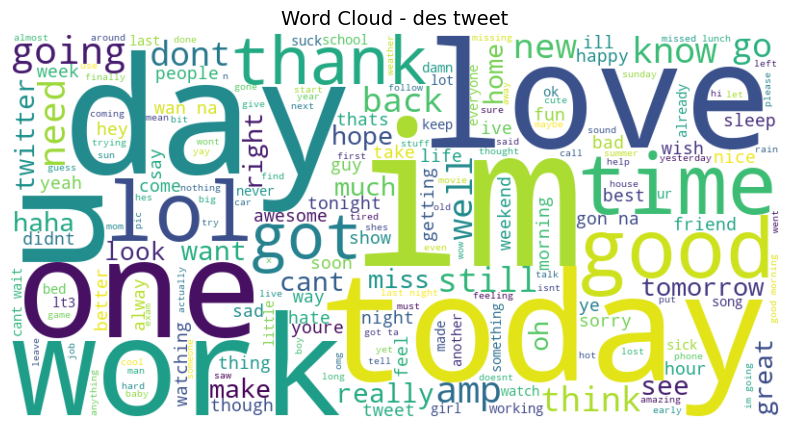

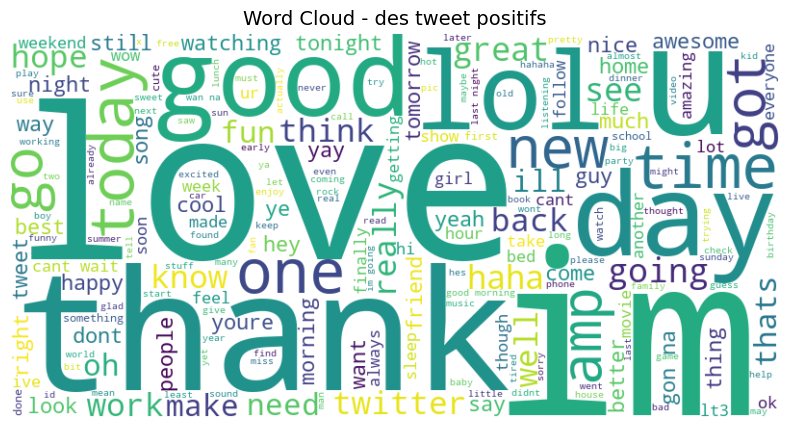

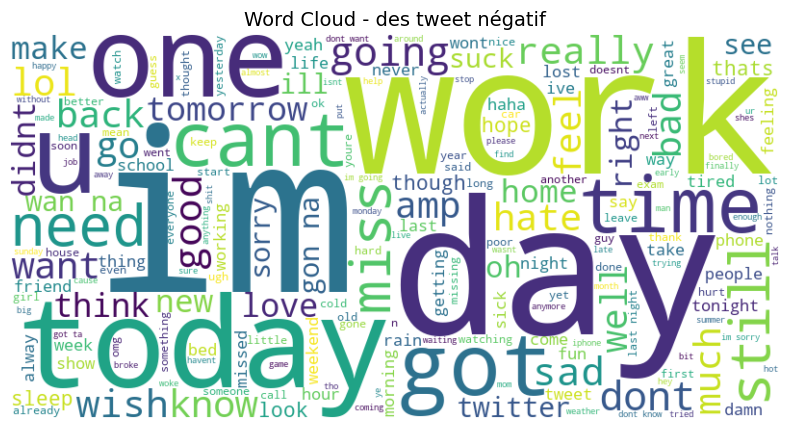

In [127]:
# Générer le word cloud pour chaque type de sentiment
generer_wordcloud(df_new['texte_nettoye'], 'Word Cloud - des tweet')
# Filtrer les tweets positifs
tweets_positifs = df_new[df_new['target'] == 1]['texte_nettoye']
generer_wordcloud(tweets_positifs, 'Word Cloud - des tweet positifs')
# Filtrer les tweets positifs
tweets_negatifs = df_new[df_new['target'] == 0]['texte_nettoye']
generer_wordcloud(tweets_negatifs, 'Word Cloud - des tweet négatif')

## 3.Conversion du texte en numerique .

Convertir le texte en numérique
TF-IDF (Term Frequency-Inverse Document Frequency)
TF-IDF est une technique utilisée en traitement automatique du langage naturel (NLP) pour évaluer l'importance d'un terme dans un document par rapport à une collection de documents. Elle combine la fréquence du terme (TF) et l'inverse de la fréquence dans les documents (IDF).

TF mesure le nombre de fois qu'un terme apparaît dans un document, tandis que IDF évalue l'importance d'un terme dans la collection globale de documents en réduisant le poids des termes fréquents.

En utilisant TF-IDF, on peut attribuer une valeur numérique à chaque terme, reflétant à la fois sa fréquence dans le document et son importance relative dans la collection de documents.

Supposons que nous ayons trois documents :

Document 1 : "Le chat est mignon."

Document 2 : "Le chien est fidèle."

Document 3 : "Le chien et le chat jouent ensemble."

Calculons maintenant le score TF-IDF pour les termes "chat" et "chien" dans chaque document :

Fréquence des termes (TF)

TF("chat", Document 1) = 1

TF("chien", Document 1) = 0

TF("chat", Document 2) = 0

TF("chien", Document 2) = 1

TF("chat", Document 3) = 1

TF("chien", Document 3) = 1

Fréquence inverse dans les documents (IDF)

IDF("chat") = log(3/2) = log(1.5) ≈ 0.18

IDF("chien") = log(3/2) = log(1.5) ≈ 0.18

TF-IDF

TF-IDF("chat", Document 1) = 1 * 0.18 ≈ 0.18

TF-IDF("chien", Document 1) = 0 * 0.18 = 0

TF-IDF("chat", Document 2) = 0 * 0.18 = 0

TF-IDF("chien", Document 2) = 1 * 0.18 ≈ 0.18

TF-IDF("chat", Document 3) = 1 * 0.18 ≈ 0.18

TF-IDF("chien", Document 3) = 1 * 0.18 ≈ 0.18

In [122]:
#tokens = word_tokenize('PAPA EST MALADE')
#tokens

['PAPA', 'EST', 'MALADE']

In [123]:
#cleaned_text = ' '.join(tokens)

In [124]:
#cleaned_text

'PAPA EST MALADE'

In [129]:
from sklearn.feature_extraction.text import TfidfVectorizer

# Créer une instance du vectoriseur TfidfVectorizer
vectorizer = TfidfVectorizer()

# Appliquer le vectoriseur sur la colonne 'texte_nettoye'
features = vectorizer.fit_transform(df_new['texte_nettoye'])

# Convertir les caractéristiques en une représentation de matrice creuse
features = features.toarray()

# Afficher les dimensions de la matrice de caractéristiques
print("Dimensions de la matrice de caractéristiques :", features.shape)

Dimensions de la matrice de caractéristiques : (20000, 33317)


## 4.Modelisation .

In [135]:
from sklearn.model_selection import train_test_split

# Diviser les données en ensembles d'entraînement et de test de façon stratifiée
X_train, X_test, y_train, y_test = train_test_split(features, df_new['target'], test_size=0.2, stratify=df_new['target'], random_state=42)

In [136]:
# Construire le modèle de régression logistique
model = LogisticRegression()
model.fit(X_train, y_train)

# Prédire les probabilités pour les ensembles d'entraînement et de test
y_train_pred = model.predict_proba(X_train)[:, 1]
y_test_pred = model.predict_proba(X_test)[:, 1]

In [137]:
y_train_pred

array([0.46595303, 0.30791753, 0.4733463 , ..., 0.90042955, 0.46583149,
       0.15864674])

In [138]:
from sklearn.metrics import roc_curve, auc, accuracy_score, precision_score, recall_score, f1_score

# Calculer les valeurs de la courbe ROC
fpr_train, tpr_train, _ = roc_curve(y_train, y_train_pred)
fpr_test, tpr_test, _ = roc_curve(y_test, y_test_pred)

# Calculer l'AUC pour les ensembles d'entraînement et de test
auc_train = auc(fpr_train, tpr_train)
auc_test = auc(fpr_test, tpr_test)

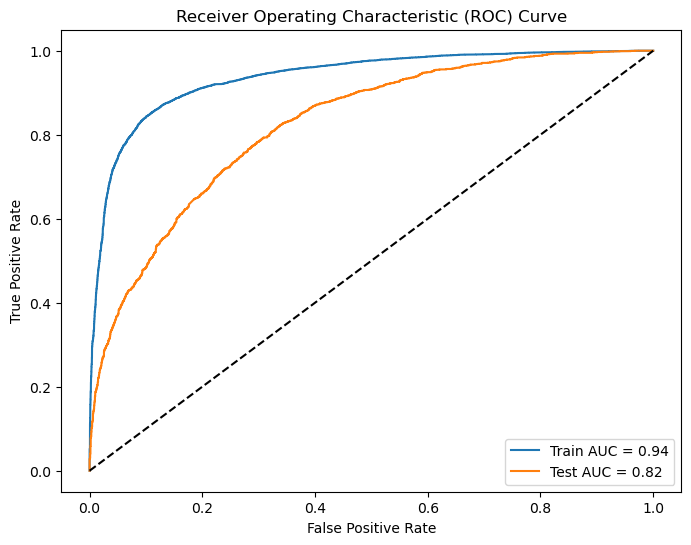

In [139]:
# Tracer la courbe ROC
plt.figure(figsize=(8, 6))
plt.plot(fpr_train, tpr_train, label='Train AUC = {:.2f}'.format(auc_train))
plt.plot(fpr_test, tpr_test, label='Test AUC = {:.2f}'.format(auc_test))
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

In [140]:
# Calculer les performances sur les ensembles d'entraînement et de test
train_accuracy = accuracy_score(y_train, model.predict(X_train))
train_precision = precision_score(y_train, model.predict(X_train))
train_recall = recall_score(y_train, model.predict(X_train))
train_f1 = f1_score(y_train, model.predict(X_train))
test_accuracy = accuracy_score(y_test, model.predict(X_test))
test_precision = precision_score(y_test, model.predict(X_test))
test_recall = recall_score(y_test, model.predict(X_test))
test_f1 = f1_score(y_test, model.predict(X_test))

# Créer un tableau des performances
performance_table = pd.DataFrame({
    'Performance': ['Accuracy', 'Precision', 'Recall', 'F1 Score'],
    'Train': [train_accuracy, train_precision, train_recall, train_f1],
    'Test': [test_accuracy, test_precision, test_recall, test_f1]
})

print(performance_table)

  Performance     Train      Test
0    Accuracy  0.868563  0.741500
1   Precision  0.862535  0.728477
2      Recall  0.876875  0.770000
3    F1 Score  0.869646  0.748663


# Deuxieme projet sur le NLP 

## Detecter le sentiment d'un tweet 

In [195]:
model.score(X_test,y_test)

0.7415

In [142]:
X_train

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [153]:
!pip install tweepy
!pip install textblob

Defaulting to user installation because normal site-packages is not writeable
     -------------------------------------- 98.5/98.5 kB 565.9 kB/s eta 0:00:00
  Attempting uninstall: requests-oauthlib
    Found existing installation: requests-oauthlib 2.0.0
    Uninstalling requests-oauthlib-2.0.0:
      Successfully uninstalled requests-oauthlib-2.0.0
Defaulting to user installation because normal site-packages is not writeable


In [196]:
# Importation de la base de données
#Une base de données de tweet sur le coronavirus 

df=pd.read_csv("vaccination_tweets.csv")
df.head(2)

,id,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,retweets,favorites,is_retweet
0,1340539111971516416,Rachel Roh,"La Crescenta-Montrose, CA",Aggregator of Asian American news; scanning di...,2009-04-08 17:52:46,405,1692,3247,False,2020-12-20 06:06:44,Same folks said daikon paste could treat a cyt...,['PfizerBioNTech'],Twitter for Android,0,0,False
1,1338158543359250433,Albert Fong,"San Francisco, CA","Marketing dude, tech geek, heavy metal & '80s ...",2009-09-21 15:27:30,834,666,178,False,2020-12-13 16:27:13,While the world has been on the wrong side of ...,NaN,Twitter Web App,1,1,False


In [197]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11020 entries, 0 to 11019
Data columns (total 16 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   id                11020 non-null  int64 
 1   user_name         11020 non-null  object
 2   user_location     8750 non-null   object
 3   user_description  10341 non-null  object
 4   user_created      11020 non-null  object
 5   user_followers    11020 non-null  int64 
 6   user_friends      11020 non-null  int64 
 7   user_favourites   11020 non-null  int64 
 8   user_verified     11020 non-null  bool  
 9   date              11020 non-null  object
 10  text              11020 non-null  object
 11  hashtags          8438 non-null   object
 12  source            11019 non-null  object
 13  retweets          11020 non-null  int64 
 14  favorites         11020 non-null  int64 
 15  is_retweet        11020 non-null  bool  
dtypes: bool(2), int64(6), object(8)
memory usage: 1.2+ MB


In [198]:
df.isnull().sum()

id                     0
user_name              0
user_location       2270
user_description     679
user_created           0
user_followers         0
user_friends           0
user_favourites        0
user_verified          0
date                   0
text                   0
hashtags            2582
source                 1
retweets               0
favorites              0
is_retweet             0
dtype: int64

In [200]:
df = df[['text','date']]
df

,text,date
0,Same folks said daikon paste could treat a cyt...,2020-12-20 06:06:44
1,While the world has been on the wrong side of ...,2020-12-13 16:27:13
2,#coronavirus #SputnikV #AstraZeneca #PfizerBio...,2020-12-12 20:33:45
3,"Facts are immutable, Senator, even when you're...",2020-12-12 20:23:59
4,Explain to me again why we need a vaccine @Bor...,2020-12-12 20:17:19
...,...,...
11015,"The number of Covid-19 cases today, 17 Novembe...",2021-11-17 11:27:49
11016,First dose ✅\n#PfizerBioNTech,2021-11-17 03:17:44
11017,"The number of Covid-19 cases today, 16 Novembe...",2021-11-16 12:14:00
11018,#PfizerBioNTech has developed new pill #Paxlov...,2021-11-15 20:29:42


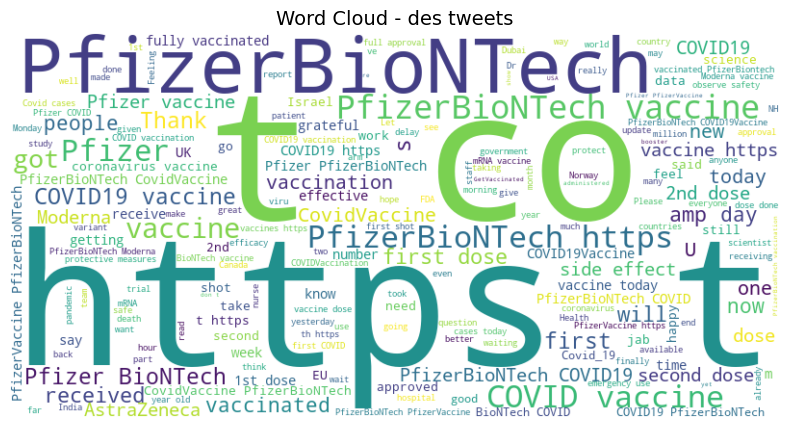

In [201]:
# Fonction pour générer le word cloud
def generer_wordcloud(tweets, titre):
    tout_texte = ' '.join(tweets)
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(tout_texte)
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(titre, fontsize=14)
    plt.axis('off')
    plt.show()

# Générer le word cloud 
generer_wordcloud(df['text'], 'Word Cloud - des tweets')

# Prétraitement des tweets
Supposons que nous ayons la phrase suivante :

"Les chiens courent dans le parc."

Lorsque nous appliquons la lemmatisation à cette phrase, nous obtenons :

"Le chien courir dans le parc."

La lemmatisation a ramené les mots à leur forme de base (lemme), en transformant "chiens" en "chien" et "courent" en "courir". Cette normalisation permet de regrouper les variantes d'un mot autour d'une seule forme canonique.

La lemmatisation est un processus essentiel dans le traitement automatique du langage naturel (TALN), car elle améliore la précision des analyses textuelles, des recherches d'informations et des tâches de classification.

Utiliser la lemmatisation aide à réduire la complexité des données textuelles en transformant les mots en leur forme canonique, ce qui facilite la comparaison, la recherche et l'analyse du texte de manière plus précise.

In [3]:
import re
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer

nltk.download('wordnet')
nltk.download('omw-1.4')
nltk.download('stopwords')
nltk.download('punkt')
stop_words = stopwords.words('english')

def clean_text(text):
    # Suppression des caractères spéciaux et de la ponctuation
    processed_tweet = re.sub(r"[^\w\s]", "", text)
    
    # Conversion en minuscules
    processed_tweet = processed_tweet.lower()
    
    # Tokenisation du texte
    tokens = word_tokenize(processed_tweet)
    
    # Suppression des mots vides
    stop_words = set(stopwords.words("english"))
    tokens = [word for word in tokens if word not in stop_words]
    
    # Lemmatisation des tokens
    lemmatizer = WordNetLemmatizer()
    tokens = [lemmatizer.lemmatize(word) for word in tokens]
    
    # Joindre les tokens en une seule chaîne
    cleaned_text = ' '.join(tokens)
    
    return cleaned_text
# La Lemmatisation


# Appliquer le nettoyage du texte sur la colonne 'texte'
df['texte_nettoye'] = df['text'].apply(clean_text)

df

[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\POSTE\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to
[nltk_data]     C:\Users\POSTE\AppData\Roaming\nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\POSTE\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\POSTE\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


NameError: name 'df' is not defined

In [203]:
stop_words

['i',
 'me',
 'my',
 'myself',
 'we',
 'our',
 'ours',
 'ourselves',
 'you',
 "you're",
 "you've",
 "you'll",
 "you'd",
 'your',
 'yours',
 'yourself',
 'yourselves',
 'he',
 'him',
 'his',
 'himself',
 'she',
 "she's",
 'her',
 'hers',
 'herself',
 'it',
 "it's",
 'its',
 'itself',
 'they',
 'them',
 'their',
 'theirs',
 'themselves',
 'what',
 'which',
 'who',
 'whom',
 'this',
 'that',
 "that'll",
 'these',
 'those',
 'am',
 'is',
 'are',
 'was',
 'were',
 'be',
 'been',
 'being',
 'have',
 'has',
 'had',
 'having',
 'do',
 'does',
 'did',
 'doing',
 'a',
 'an',
 'the',
 'and',
 'but',
 'if',
 'or',
 'because',
 'as',
 'until',
 'while',
 'of',
 'at',
 'by',
 'for',
 'with',
 'about',
 'against',
 'between',
 'into',
 'through',
 'during',
 'before',
 'after',
 'above',
 'below',
 'to',
 'from',
 'up',
 'down',
 'in',
 'out',
 'on',
 'off',
 'over',
 'under',
 'again',
 'further',
 'then',
 'once',
 'here',
 'there',
 'when',
 'where',
 'why',
 'how',
 'all',
 'any',
 'both',
 'each

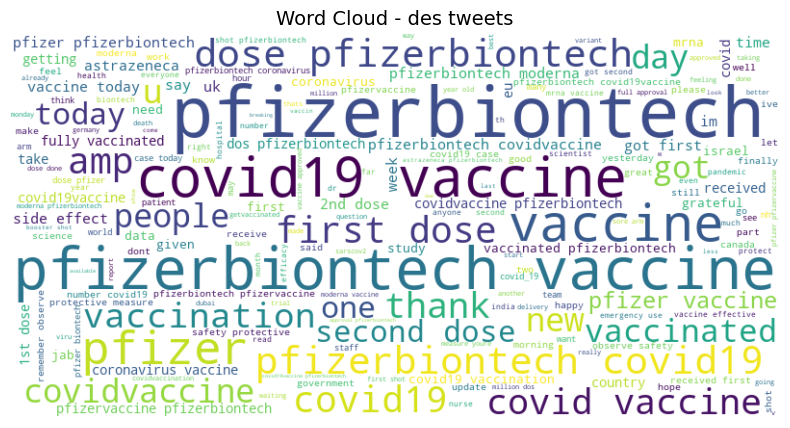

In [214]:
# Générer le word cloud 
generer_wordcloud(df['texte_nettoye'], 'Word Cloud - des tweets')

# Analyse des sentiments

In [215]:
example1=TextBlob("Je suis contente d'avoir réalisé le challenge #100JoursDeML")
print(example1.sentiment)

Sentiment(polarity=0.0, subjectivity=0.0)


In [216]:
example4=TextBlob("I love you more than my life ,will you marry me ? ")
print(example4.sentiment)

Sentiment(polarity=0.5, subjectivity=0.55)


In [217]:
example5=TextBlob("I hate you because know you're cheating on me with Joseph")
print(example5.sentiment)

Sentiment(polarity=-0.8, subjectivity=0.9)


In [218]:
example2=TextBlob("This situation makes me sad and frustrated.")
print(example2.sentiment)

Sentiment(polarity=-0.6, subjectivity=0.6)


In [219]:
example3=TextBlob("Tomorrow is the end of the challenge.")
print(example3.sentiment)

Sentiment(polarity=0.0, subjectivity=0.0)


In [172]:
from flair.models import TextClassifier
from flair.data import Sentence

texte = "Je suis contente d'avoir réalisé le challenge #100JoursDeML"

classifier = TextClassifier.load("sentiment")
sentence = Sentence(texte)

classifier.predict(sentence)

polarite = sentence.labels[0].score
label = sentence.labels[0].value

print("Polarité du sentiment :", polarite)
print("Étiquette du sentiment :", label)

2024-08-24 21:14:27,558 https://nlp.informatik.hu-berlin.de/resources/models/sentiment-curated-distilbert/sentiment-en-mix-distillbert_4.pt not found in cache, downloading to C:\Users\POSTE\AppData\Local\Temp\tmpgrarol3r


100%|████████████████████████████████████████████████████████████████████████████████| 253M/253M [06:16<00:00, 706kB/s]

2024-08-24 21:20:43,773 copying C:\Users\POSTE\AppData\Local\Temp\tmpgrarol3r to cache at C:\Users\POSTE\.flair\models\sentiment-en-mix-distillbert_4.pt


2024-08-24 21:20:44,135 removing temp file C:\Users\POSTE\AppData\Local\Temp\tmpgrarol3r


tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/483 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

Polarité du sentiment : 0.9991108775138855
Étiquette du sentiment : POSITIVE


In [171]:
!pip install flair

Defaulting to user installation because normal site-packages is not writeable


In [220]:
#Calcule de la polarité
df['polarity'] = df['texte_nettoye'].apply(lambda x: TextBlob(x).sentiment[0])
df['subjectivity'] = df['texte_nettoye'].apply(lambda x: TextBlob(x).sentiment[1])
# Définir les étiquettes de sentiment en fonction de la polarité
df['Sentiment'] = df['polarity'].apply(lambda x: 'Positif' if x > 0 else ('Négatif' if x < 0 else 'Neutre'))
df

,text,date,texte_nettoye,polarity,subjectivity,Sentiment
0,Same folks said daikon paste could treat a cyt...,2020-12-20 06:06:44,folk said daikon paste could treat cytokine st...,0.000000,0.000000,Neutre
1,While the world has been on the wrong side of ...,2020-12-13 16:27:13,world wrong side history year hopefully bigges...,-0.500000,0.900000,Négatif
2,#coronavirus #SputnikV #AstraZeneca #PfizerBio...,2020-12-12 20:33:45,coronavirus sputnikv astrazeneca pfizerbiontec...,0.000000,0.033333,Neutre
3,"Facts are immutable, Senator, even when you're...",2020-12-12 20:23:59,fact immutable senator even youre ethically st...,0.100000,0.550000,Positif
4,Explain to me again why we need a vaccine @Bor...,2020-12-12 20:17:19,explain need vaccine borisjohnson matthancock ...,0.000000,0.000000,Neutre
...,...,...,...,...,...,...
11015,"The number of Covid-19 cases today, 17 Novembe...",2021-11-17 11:27:49,number covid19 case today 17 november 2021 rem...,0.000000,0.000000,Neutre
11016,First dose ✅\n#PfizerBioNTech,2021-11-17 03:17:44,first dose pfizerbiontech,0.250000,0.333333,Positif
11017,"The number of Covid-19 cases today, 16 Novembe...",2021-11-16 12:14:00,number covid19 case today 16 november 2021 rem...,0.000000,0.000000,Neutre
11018,#PfizerBioNTech has developed new pill #Paxlov...,2021-11-15 20:29:42,pfizerbiontech developed new pill paxlovid inc...,-0.121212,0.501515,Négatif


In [221]:
# Calculer les statistiques sur la polarité
df['polarity'].describe()

count    11020.000000
mean         0.100568
std          0.232226
min         -1.000000
25%          0.000000
50%          0.000000
75%          0.212946
max          1.000000
Name: polarity, dtype: float64

In [222]:
# Calculer les statistiques sur la subjectivité
df['subjectivity'].describe()

count    11020.000000
mean         0.274878
std          0.303137
min          0.000000
25%          0.000000
50%          0.200000
75%          0.500000
max          1.000000
Name: subjectivity, dtype: float64

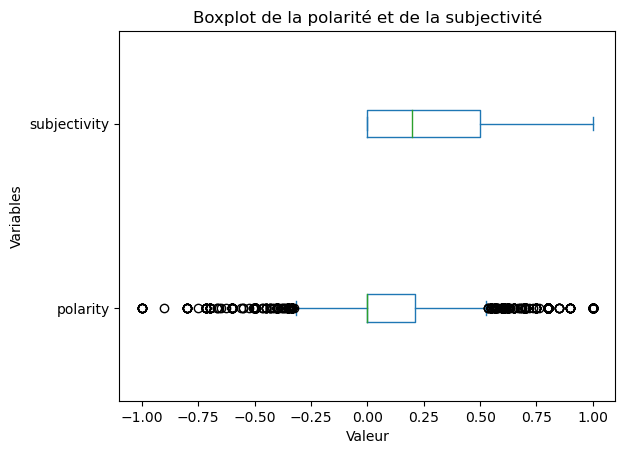

In [177]:
# Tracer le boxplot pour la polarité et la subjectivité
df[['polarity', 'subjectivity']].plot(kind='box', vert=False)

# Ajouter des titres et des étiquettes d'axe
plt.title('Boxplot de la polarité et de la subjectivité')
plt.xlabel('Valeur')
plt.ylabel('Variables')

# Afficher le boxplot
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


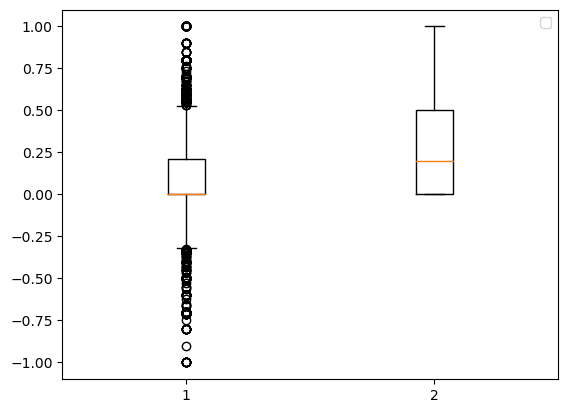

In [226]:
plt.boxplot(df[['polarity', 'subjectivity']])
plt.legend()

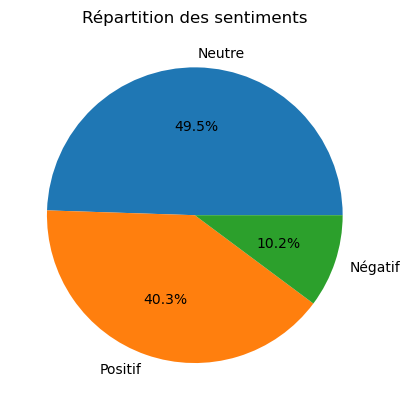

In [228]:
# Compter le nombre de chaque sentiment
sentiment_counts = df['Sentiment'].value_counts()

# Obtenir les étiquettes de sentiment et les valeurs correspondantes
labels = sentiment_counts.index.tolist()
values = sentiment_counts.values.tolist()

# Tracer le diagramme circulaire
plt.pie(values, labels=labels, autopct='%1.1f%%')

# Ajouter un titre
plt.title("Répartition des sentiments")

# Afficher le diagramme circulaire
plt.show()

In [233]:
sentiment_counts = df['Sentiment'].value_counts()
sentiment_counts.values.tolist()

[5453, 4444, 1123]

In [179]:
import plotly.express as px
fig = px.scatter(df,x='polarity',y='subjectivity')
fig.show()

In [180]:
# Convertir la colonne 'Date' en type de données 'datetime'
df['date'] = pd.to_datetime(df['date'])

# Trier le DataFrame par ordre croissant de dates
df = df.sort_values('date')

# Créer la figure
fig = go.Figure()

# Ajouter la trace de ligne pour l'évolution de la polarité dans le temps
fig.add_trace(go.Scatter(x=df['date'], y=df['polarity'], mode='lines', name='Polarité'))

# Mettre en forme le titre et les étiquettes d'axe
fig.update_layout(title='Évolution de la polarité dans le temps',
                  xaxis=dict(title='Date'),
                  yaxis=dict(title='Polarité'))

# Afficher le graphique
fig.show()

NameError: name 'go' is not defined

In [235]:
import plotly.express as px
# Convertir la colonne 'date' en type datetime
df['date'] = pd.to_datetime(df['date'])

# Enlever les heures de la date
df['date'] = df['date'].dt.date
# Calculer le nombre de tweets par sentiment et par date
df_agg = df.groupby(['date', 'Sentiment']).size().reset_index(name='counts')

df_agg.head()

,date,Sentiment,counts
0,2020-12-12,Neutre,34
1,2020-12-12,Négatif,7
2,2020-12-12,Positif,22
3,2020-12-13,Neutre,50
4,2020-12-13,Négatif,10


In [236]:
fig = px.line(df_agg, x='date', y='counts', color='Sentiment', title='Analyse de sentiment des vaccins COVID-19')

fig.show()

In [237]:
# Grouper par date et compter le nombre de sentiments positifs, négatifs et neutres
sentiment_counts = df.groupby('date')['Sentiment'].value_counts().unstack().fillna(0)

# Afficher le résultat
print(sentiment_counts)

Sentiment   Neutre  Négatif  Positif
date                                
2020-12-12    34.0      7.0     22.0
2020-12-13    50.0     10.0     38.0
2020-12-14    61.0     10.0     66.0
2020-12-15    71.0     16.0     63.0
2020-12-16    64.0     20.0     60.0
...            ...      ...      ...
2021-11-19     2.0      0.0      5.0
2021-11-20     8.0      0.0      4.0
2021-11-21     4.0      0.0      1.0
2021-11-22     3.0      0.0      2.0
2021-11-23     8.0      1.0      1.0

[282 rows x 3 columns]


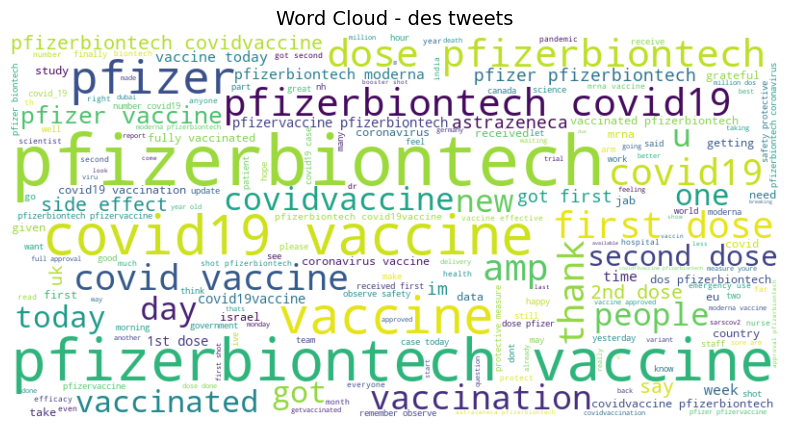

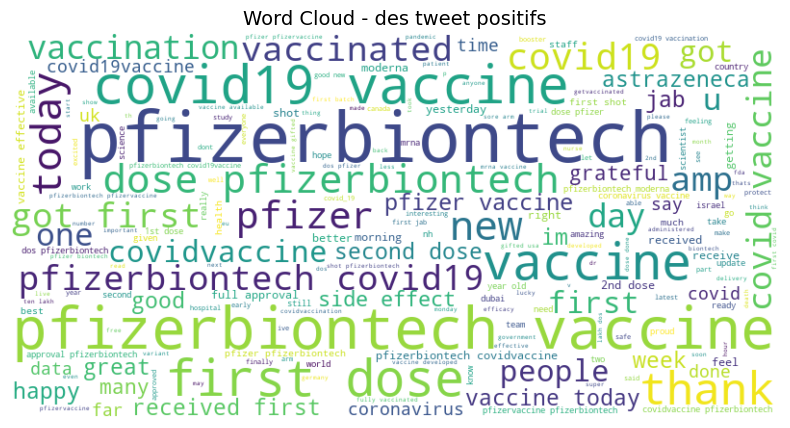

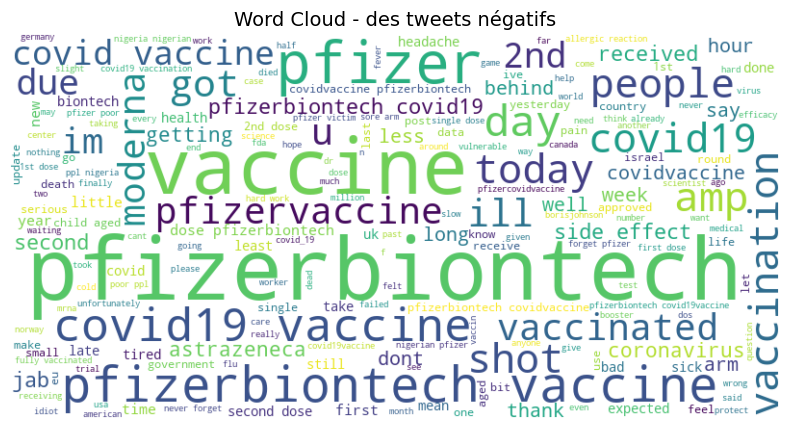

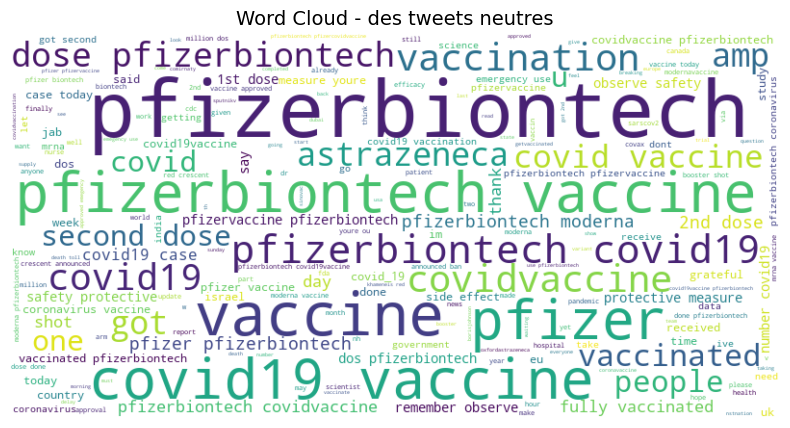

In [238]:
# Générer le word cloud pour chaque type de sentiment
generer_wordcloud(df['texte_nettoye'], 'Word Cloud - des tweets')
# Filtrer les tweets positifs
tweets_positifs = df[df['polarity']>0]['texte_nettoye']
generer_wordcloud(tweets_positifs, 'Word Cloud - des tweet positifs')
# Filtrer les tweets positifs
tweets_negatifs = df[df['polarity'] < 0]['texte_nettoye']
generer_wordcloud(tweets_negatifs, 'Word Cloud - des tweets négatifs')
# Filtrer les tweets positifs
tweets_neutre = df[df['polarity'] ==0]['texte_nettoye']
generer_wordcloud(tweets_neutre, 'Word Cloud - des tweets neutres')

In [239]:
# Breaking down the tweets into words in seperate categories
positive_tokens = [token for line in tweets_positifs for token in line.split()]
negative_tokens = [token for line in tweets_negatifs for token in line.split()]
neutral_tokens = [token for line in tweets_neutre for token in line.split()]

In [240]:
from collections import Counter
# pour obtenir les mots les plus utilisés
def get_maxtoken(tweets, num=30):
  word_tokens = Counter(tweets)
  max_common = word_tokens.most_common(num)
  return dict(max_common)

def token_df_vis(x, title):
  df = pd.DataFrame(get_maxtoken(x).items(),columns=['words','count'])
  fig = px.bar(df,x='words',y='count',title = title)
  fig.show()

In [241]:
token_df_vis(positive_tokens,'Positive')
token_df_vis(negative_tokens,'Negative')
token_df_vis(neutral_tokens,'Neutral')

# Analyse par type de vaccin .

In [188]:
#Création des tags de référence pour 5 vaccins -> Pfizer, Covaxin (Bharat Biotech), Sputnik, AstraZenca (Covishield), Moderna.
pfizer_refs = ["Pfizer","pfizer","Pfizer–BioNTech","pfizer-bioNtech","BioNTech","biontech"]
bbiotech_refs = ["covax","covaxin","Covax","Covaxin","Bharat Biotech","bharat biotech","BharatBiotech","bharatbiotech"]
sputnik_refs = ["russia","sputnik","Sputnik","V"]
astra_refs = ['sii','SII','adar poonawalla','Covishield','covishield','astra','zenca','Oxford–AstraZeneca','astrazenca','oxford-astrazenca','serum institiute']
moderna_refs = ['moderna','Moderna','mRNA-1273','Spikevax']

In [189]:
def refer(tweet, refs):
  flag =0
  for ref in refs:
    if tweet.find(ref) != -1:
      flag =1
  return flag

df['pfizer'] = df['texte_nettoye'].apply(lambda x : refer(x, pfizer_refs))
df['bbiotech'] = df['texte_nettoye'].apply(lambda x : refer(x, bbiotech_refs))
df['sputnik'] = df['texte_nettoye'].apply(lambda x : refer(x, sputnik_refs))
df['astra'] = df['texte_nettoye'].apply(lambda x : refer(x, astra_refs))
df['moderna'] = df['texte_nettoye'].apply(lambda x : refer(x, moderna_refs))
df

,text,date,texte_nettoye,polarity,subjectivity,Sentiment,pfizer,bbiotech,sputnik,astra,moderna
44,#FDA authorizes #PfizerBioNTech #coronavirus v...,2020-12-12,fda authorizes pfizerbiontech coronavirus vacc...,0.000000,0.000000,Neutre,1,0,0,0,0
43,Trump announces #vaccine rollout 'in less than...,2020-12-12,trump announces vaccine rollout less 24 hour f...,0.027778,0.133333,Positif,0,0,0,0,0
42,#CovidVaccine #Pfizer-BioNTech COVID-19 #Pfize...,2020-12-12,covidvaccine pfizerbiontech covid19 pfizerbion...,0.000000,0.000000,Neutre,1,0,0,0,0
41,FACT SHEET FOR RECIPIENTS AND CAREGIVERS\n\n#P...,2020-12-12,fact sheet recipient caregiver pfizerbiontech ...,0.000000,0.000000,Neutre,1,0,0,0,0
40,@mirekR9 @sputnikvaccine @AstraZeneca it's the...,2020-12-12,mirekr9 sputnikvaccine astrazeneca one doesnt ...,0.000000,0.000000,Neutre,1,0,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...
10963,The expansion is valid for both Moderna and Pf...,2021-11-23,expansion valid moderna pfizerbiontech covid19...,0.000000,0.400000,Neutre,1,0,0,0,1
10962,#Moderna and #PfizerBioNTech \n\nFull report: ...,2021-11-23,moderna pfizerbiontech full report httpstcog6c...,0.350000,0.550000,Positif,1,0,0,0,1
10961,Nothing to see here 👀\n\n#Health #heartattack ...,2021-11-23,nothing see health heartattack myocarditis per...,0.000000,0.000000,Neutre,1,0,0,0,1
10960,#PfizerBiontech #CovidVaccines the effects #M...,2021-11-23,pfizerbiontech covidvaccines effect msm hiding...,0.000000,0.000000,Neutre,1,0,0,0,0


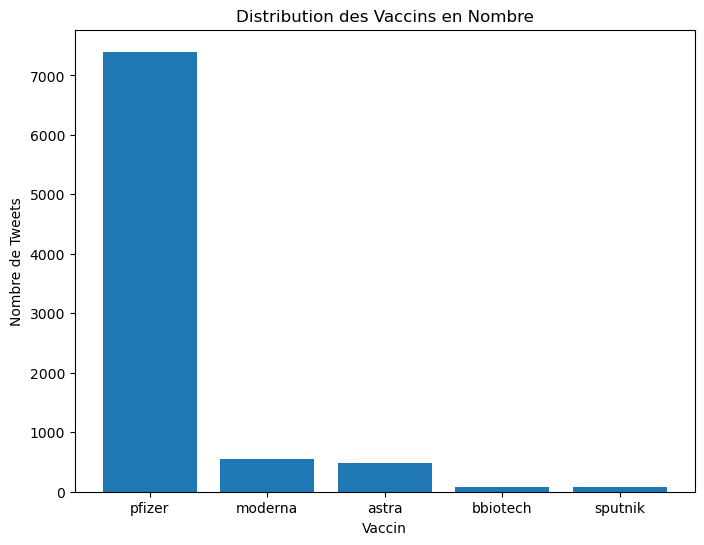

In [190]:
# Liste des noms de vaccins
vaccine_names = ['pfizer', 'moderna', 'astra', 'bbiotech', 'sputnik']

# Calculer la distribution de chaque vaccin en nombre
vaccine_counts = df[vaccine_names].sum()

# Créer un graphique à barres pour la distribution de chaque vaccin
plt.figure(figsize=(8, 6))
plt.bar(vaccine_names, vaccine_counts)
plt.title('Distribution des Vaccins en Nombre')
plt.xlabel('Vaccin')
plt.ylabel('Nombre de Tweets')
plt.show()

In [191]:
# Initialiser un DataFrame vide pour les résultats
results_df = pd.DataFrame(columns=['Vaccin', 'Moyenne Polarity', 'Max Polarity', 'Min Polarity', 'Médiane Polarity',
                                   'Moyenne Subjectivity', 'Max Subjectivity', 'Min Subjectivity', 'Médiane Subjectivity'])
# Liste des noms de vaccins
vaccine_names = ['pfizer', 'moderna', 'astra', 'bbiotech', 'sputnik']

# Parcourir les vaccins
for vaccine in vaccine_names:
    # Filtrer le DataFrame pour le vaccin spécifique
    filtered_df = df[df[vaccine] == 1]
    
    # Calculer les statistiques pour la polarité et la subjectivité
    polarity_stats = filtered_df['polarity'].agg(['mean', 'max', 'min', 'median'])
    subjectivity_stats = filtered_df['subjectivity'].agg(['mean', 'max', 'min', 'median'])
    
    # Ajouter les résultats au DataFrame des résultats
    results_df = results_df.append({'Vaccin': vaccine,
                                    'Moyenne Polarity': polarity_stats['mean'],
                                    'Max Polarity': polarity_stats['max'],
                                    'Min Polarity': polarity_stats['min'],
                                    'Médiane Polarity': polarity_stats['median'],
                                    'Moyenne Subjectivity': subjectivity_stats['mean'],
                                    'Max Subjectivity': subjectivity_stats['max'],
                                    'Min Subjectivity': subjectivity_stats['min'],
                                    'Médiane Subjectivity': subjectivity_stats['median']}, ignore_index=True)

# Afficher le DataFrame des résultats
results_df

C:\Users\POSTE\AppData\Local\Temp\ipykernel_21804\2203543955.py:17: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\POSTE\AppData\Local\Temp\ipykernel_21804\2203543955.py:17: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\POSTE\AppData\Local\Temp\ipykernel_21804\2203543955.py:17: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\POSTE\AppData\Local\Temp\ipykernel_21804\2203543955.py:17: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\POSTE\AppData\Local\Temp\ipykernel_21804\2203543955.py:17: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.co

,Vaccin,Moyenne Polarity,Max Polarity,Min Polarity,Médiane Polarity,Moyenne Subjectivity,Max Subjectivity,Min Subjectivity,Médiane Subjectivity
0,pfizer,0.099360,1.0,-1.000000,0.0,0.252860,1.0,0.0,0.111111
1,moderna,0.094029,1.0,-0.714286,0.0,0.250713,1.0,0.0,0.000000
2,astra,0.092127,1.0,-0.700000,0.0,0.256679,1.0,0.0,0.100000
3,bbiotech,0.059863,0.8,-0.500000,0.0,0.221396,1.0,0.0,0.000000
4,sputnik,0.011118,1.0,-0.700000,0.0,0.150123,0.9,0.0,0.000000


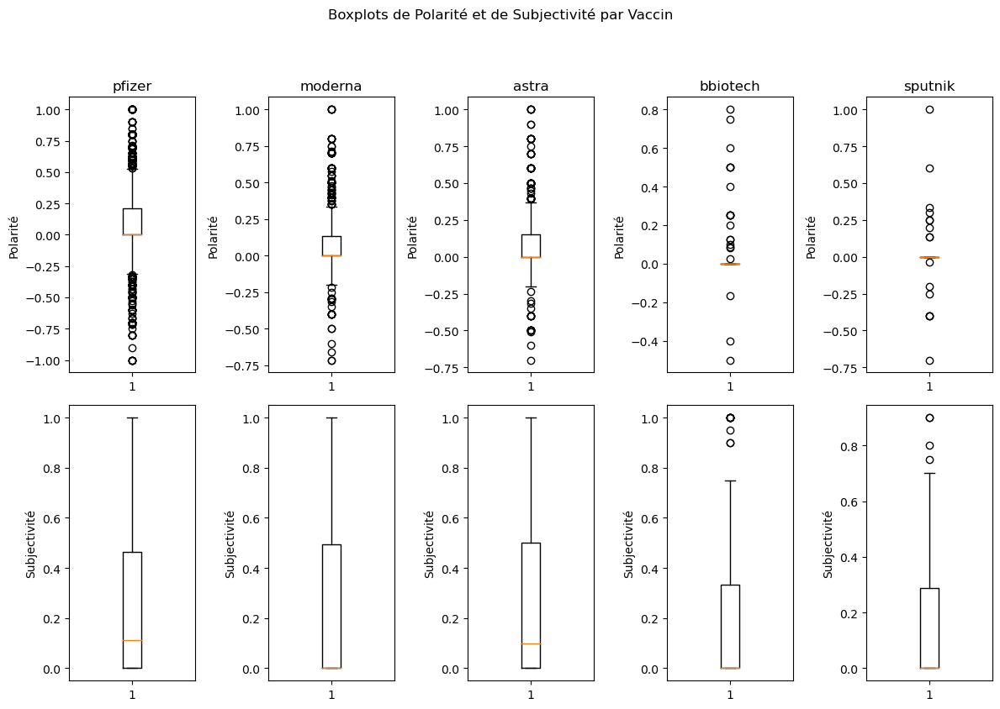

In [192]:
# Création des boxplots pour la polarité et la subjectivité pour chaque vaccin
fig, axes = plt.subplots(nrows=2, ncols=len(vaccine_names), figsize=(12, 8))

for i, vaccine in enumerate(vaccine_names):
    # Boxplot de la polarité pour le vaccin spécifique
    axes[0, i].boxplot(df[df[vaccine] == 1]['polarity'])
    axes[0, i].set_title(vaccine)
    axes[0, i].set_ylabel('Polarité')
    
    # Boxplot de la subjectivité pour le vaccin spécifique
    axes[1, i].boxplot(df[df[vaccine] == 1]['subjectivity'])
    axes[1, i].set_ylabel('Subjectivité')

# Ajouter des titres et ajuster les espacements
fig.suptitle('Boxplots de Polarité et de Subjectivité par Vaccin', y=1.05)
plt.tight_layout()

# Afficher les boxplots
plt.show()

In [193]:
# Liste des noms de vaccins
vaccine_names = ['pfizer', 'bbiotech', 'sputnik', 'astra', 'moderna']

# Créer des graphiques séparés pour l'évolution de la moyenne mobile de la polarité par date pour chaque vaccin
for vaccine in vaccine_names:
    fig = px.line(df[df[vaccine] == 1], x='date', y='polarity', 
                  title=f'Évolution de la Moyenne Mobile de la Polarité ({vaccine.capitalize()})')
    fig.show()

In [194]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Liste des noms de vaccins
vaccine_names = ['pfizer', 'bbiotech', 'sputnik', 'astra', 'moderna']

# Créer un graphique séparé pour chaque vaccin
for vaccine in vaccine_names:
    filtered_df = df[df[vaccine] == 1]  # Filtrer les données pour le vaccin spécifique
    filtered_df['rolling_mean'] = filtered_df['polarity'].rolling(window=3, min_periods=1).mean()  # Calculer la moyenne mobile

    fig = go.Figure()
    fig.add_trace(go.Scatter(x=filtered_df['date'], y=filtered_df['rolling_mean'], name=vaccine.capitalize()))

    fig.update_layout(title=f'Évolution de la Moyenne Mobile de la Polarité ({vaccine.capitalize()})',
                      xaxis=dict(title='Date'),
                      yaxis=dict(title='Moyenne Mobile de la Polarité'))

    fig.show()

C:\Users\POSTE\AppData\Local\Temp\ipykernel_21804\4011864772.py:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



C:\Users\POSTE\AppData\Local\Temp\ipykernel_21804\4011864772.py:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



C:\Users\POSTE\AppData\Local\Temp\ipykernel_21804\4011864772.py:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



C:\Users\POSTE\AppData\Local\Temp\ipykernel_21804\4011864772.py:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



C:\Users\POSTE\AppData\Local\Temp\ipykernel_21804\4011864772.py:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



## Aide memoire de techniques de pro pour coder .

In [242]:
#Astuce 1 :Declaration de plusieurs variables 
nom,prenom,age="Toto",'Martin',25
print(nom,prenom,age)

Toto Martin 25


In [254]:
#Actuce 2:Permutation de variables sans créer une varibale temporaire 
nom,prenom=prenom,nom
#Astuce 3:f-strings pour automatiser certaines taches
poids=10

temp= print(f'Mon nom est:{nom};Mon prenom est:{prenom} et l"/age est {age};son poids est :{poids:.2f}')
temp

Mon nom est:Martin;Mon prenom est:Toto et l"/age est 25;son poids est :10.00


In [259]:
#Astuce 4 :le join:Fusionner les elements d'une liste à partir de séparateurs
liste=['Bienvenue','dans','ma','maison']
temp='_'.join(liste)
temp

'Bienvenue_dans_ma_maison'

In [262]:
#Astuce 5:split
temp.split('_')

['Bienvenue', 'dans', 'ma', 'maison']

In [267]:
#Astuce 6 : Lambda function
def square(x):
    return x**2

square1=lambda x:x**2
square1(4)
#Astuce 7:Liste en comprehension
ca=[12000,1400,44900,5500]
liste_vide=[]
for i in ca:
    liste_vide.append(i**2)
    print(liste_vide)

[144000000]
[144000000, 1960000]
[144000000, 1960000, 2016010000]
[144000000, 1960000, 2016010000, 30250000]


In [269]:
ca_square=[i**2 for i in ca]
ca_square

[144000000, 1960000, 2016010000, 30250000]

In [273]:
#Astuce 8 :map
ca_square3=list(map(lambda x:x**2,ca))
ca_square3
#Astuuce 9:avoir l'element et la liste:
for index,valeur in enumerate(ca):
    print(f"l'indice est {index} et la valeur est {valeur}")


l'indice est 0 et la valeur est 12000
l'indice est 1 et la valeur est 1400
l'indice est 2 et la valeur est 44900
l'indice est 3 et la valeur est 5500


## Projet 3 NLP+ML

In [52]:
data1=pd.read_csv('./YouTube-Spam-Collection-v1/Youtube01-Psy.csv')
data2=pd.read_csv('./YouTube-Spam-Collection-v1/Youtube02-KatyPerry.csv')
data3=pd.read_csv('./YouTube-Spam-Collection-v1/Youtube03-LMFAO.csv')
data4=pd.read_csv('./YouTube-Spam-Collection-v1/Youtube04-Eminem.csv')
data5=pd.read_csv('./YouTube-Spam-Collection-v1/Youtube05-Shakira.csv')
data1.head()

,COMMENT_ID,AUTHOR,DATE,CONTENT,CLASS
0,LZQPQhLyRh80UYxNuaDWhIGQYNQ96IuCg-AYWqNPjpU,Julius NM,2013-11-07T06:20:48,"Huh, anyway check out this you[tube] channel: ...",1
1,LZQPQhLyRh_C2cTtd9MvFRJedxydaVW-2sNg5Diuo4A,adam riyati,2013-11-07T12:37:15,Hey guys check out my new channel and our firs...,1
2,LZQPQhLyRh9MSZYnf8djyk0gEF9BHDPYrrK-qCczIY8,Evgeny Murashkin,2013-11-08T17:34:21,just for test I have to say murdev.com,1
3,z13jhp0bxqncu512g22wvzkasxmvvzjaz04,ElNino Melendez,2013-11-09T08:28:43,me shaking my sexy ass on my channel enjoy ^_^ ﻿,1
4,z13fwbwp1oujthgqj04chlngpvzmtt3r3dw,GsMega,2013-11-10T16:05:38,watch?v=vtaRGgvGtWQ Check this out .﻿,1


In [53]:
data=pd.concat([data1,data2,data3,data4,data5])

In [54]:
data.shape

(1956, 5)

In [55]:
data.CONTENT.iloc[3]

'me shaking my sexy ass on my channel enjoy ^_^ \ufeff'

In [56]:
data['CONTENT'].iloc[3]

'me shaking my sexy ass on my channel enjoy ^_^ \ufeff'

In [57]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1956 entries, 0 to 369
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   COMMENT_ID  1956 non-null   object
 1   AUTHOR      1956 non-null   object
 2   DATE        1711 non-null   object
 3   CONTENT     1956 non-null   object
 4   CLASS       1956 non-null   int64 
dtypes: int64(1), object(4)
memory usage: 91.7+ KB


In [58]:
data.CLASS.value_counts(normalize=True)

1    0.513804
0    0.486196
Name: CLASS, dtype: float64

In [59]:
#Trai/Test split
from sklearn.model_selection import train_test_split
seed=123

X_train,X_test,y_train,y_test=train_test_split(data['CONTENT'],data['CLASS'],
                                              test_size=0.2,random_state=seed
                                              
                                              )

In [60]:
#Quand on fait du NLP ou ML,toujours de vecteurs numeriques :Le bag of word ou sac de mots en francais.
#TF-IDF ou Bag of words permettent également de tockeniser et vectoriser
from sklearn.feature_extraction.text import CountVectorizer

In [61]:
vectorizer=CountVectorizer()
X_train_vec=vectorizer.fit_transform(X_train)
X_test_vec=vectorizer.transform(X_test)

In [62]:
X_train_vec

<1564x3846 sparse matrix of type '<class 'numpy.int64'>'
	with 20361 stored elements in Compressed Sparse Row format>

In [63]:
vectorizer.get_feature_names_out() #Les 3846 mots distincs qui sont features

array(['00', '000', '002', ..., 'ｔｈｉｓ', 'ｕｓｒ', 'ｗｗｗ'], dtype=object)

In [64]:
from sklearn.ensemble import RandomForestClassifier

In [65]:
rf=RandomForestClassifier(random_state=seed)


In [66]:
rf.fit(X_train_vec,y_train)

RandomForestClassifier(random_state=123)

In [67]:
rf.predict(X_test_vec)

array([0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1,
       0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 1, 1,
       0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 0,
       1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1,
       1, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1,
       1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1,
       0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1,
       0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0,
       0, 1, 0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1,
       1, 0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1, 0, 1, 0,
       1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1,
       1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1,
       0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1, 1,
       1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1,

In [68]:
X_test_vec,X_train_vec #Il faut que les deux matrices aient les memes features

(<392x3846 sparse matrix of type '<class 'numpy.int64'>'
 	with 4771 stored elements in Compressed Sparse Row format>,
 <1564x3846 sparse matrix of type '<class 'numpy.int64'>'
 	with 20361 stored elements in Compressed Sparse Row format>)

In [69]:
rf.score(X_test_vec,y_test)

0.9617346938775511

In [70]:
from sklearn.metrics import classification_report

In [71]:
print(classification_report(y_test,rf.predict(X_test_vec)))

              precision    recall  f1-score   support

           0       0.94      0.98      0.96       187
           1       0.98      0.95      0.96       205

    accuracy                           0.96       392
   macro avg       0.96      0.96      0.96       392
weighted avg       0.96      0.96      0.96       392



In [72]:
#On va tester la validation croisée:On regarde la performance
from sklearn.model_selection import cross_val_score

score=cross_val_score(rf,X_train_vec,y_train,cv=10)
score


array([0.94904459, 0.94904459, 0.96178344, 0.98089172, 0.96794872,
       0.96794872, 0.93589744, 0.96794872, 0.95512821, 0.93589744])

In [73]:
score.mean()

0.9571533561979422

In [74]:
#Inference
rf.predict(vectorizer.transform(['join me to have fun on XXX money']))

array([1], dtype=int64)

## Feature Engineering du meme projet :detection de spams

In [75]:
data['CONTENT_LENGHT']=data['CONTENT'].apply(lambda x:len(x))
data.head(4)

,COMMENT_ID,AUTHOR,DATE,CONTENT,CLASS,CONTENT_LENGHT
0,LZQPQhLyRh80UYxNuaDWhIGQYNQ96IuCg-AYWqNPjpU,Julius NM,2013-11-07T06:20:48,"Huh, anyway check out this you[tube] channel: ...",1,56
1,LZQPQhLyRh_C2cTtd9MvFRJedxydaVW-2sNg5Diuo4A,adam riyati,2013-11-07T12:37:15,Hey guys check out my new channel and our firs...,1,166
2,LZQPQhLyRh9MSZYnf8djyk0gEF9BHDPYrrK-qCczIY8,Evgeny Murashkin,2013-11-08T17:34:21,just for test I have to say murdev.com,1,38
3,z13jhp0bxqncu512g22wvzkasxmvvzjaz04,ElNino Melendez,2013-11-09T08:28:43,me shaking my sexy ass on my channel enjoy ^_^ ﻿,1,48


In [76]:
#On crée la variable qui donne le taux de ponctuation dans un message ou un texte

import string
string.punctuation

'!"#$%&\'()*+,-./:;<=>?@[\\]^_`{|}~'

In [77]:
def count_punctuation(text):
    count_list=[1 for ch in text if ch in string.punctuation]
    nb_punctuation=sum(count_list)
    total=len(text) - text.count(' ')
    return nb_punctuation/total

In [78]:
data['PUNCTUATION_RATE']=data['CONTENT'].apply(lambda x :count_punctuation(x))

In [79]:
data.head(5)

,COMMENT_ID,AUTHOR,DATE,CONTENT,CLASS,CONTENT_LENGHT,PUNCTUATION_RATE
0,LZQPQhLyRh80UYxNuaDWhIGQYNQ96IuCg-AYWqNPjpU,Julius NM,2013-11-07T06:20:48,"Huh, anyway check out this you[tube] channel: ...",1,56,0.081633
1,LZQPQhLyRh_C2cTtd9MvFRJedxydaVW-2sNg5Diuo4A,adam riyati,2013-11-07T12:37:15,Hey guys check out my new channel and our firs...,1,166,0.066667
2,LZQPQhLyRh9MSZYnf8djyk0gEF9BHDPYrrK-qCczIY8,Evgeny Murashkin,2013-11-08T17:34:21,just for test I have to say murdev.com,1,38,0.032258
3,z13jhp0bxqncu512g22wvzkasxmvvzjaz04,ElNino Melendez,2013-11-09T08:28:43,me shaking my sexy ass on my channel enjoy ^_^ ﻿,1,48,0.078947
4,z13fwbwp1oujthgqj04chlngpvzmtt3r3dw,GsMega,2013-11-10T16:05:38,watch?v=vtaRGgvGtWQ Check this out .﻿,1,39,0.090909


Text(0.5, 1.0, 'longueur du commentaire')

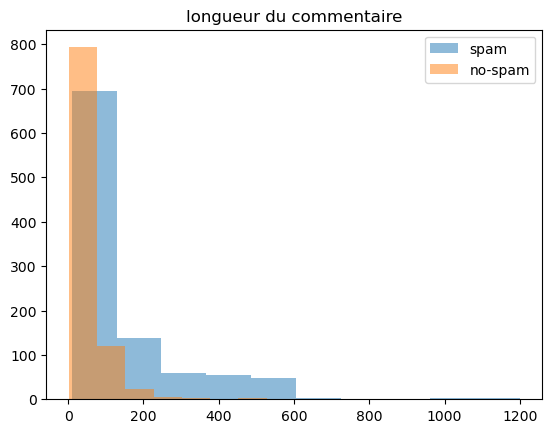

In [83]:
#Visualisation

import matplotlib.pyplot as plt
plt.hist(data[data["CLASS"]==1]['CONTENT_LENGHT'],alpha=0.5,label='spam')

plt.hist(data[data["CLASS"]==0]['CONTENT_LENGHT'],alpha=0.5,label='no-spam')

plt.legend(loc='upper right')
plt.title('longueur du commentaire')


In [84]:
#On constate que la longueur de spams est plus grande que les spams qui est jusqu') 300 seulement et l'autre jusqu'a 600

Text(0.5, 1.0, 'Taux de ponctuation du commentaire')

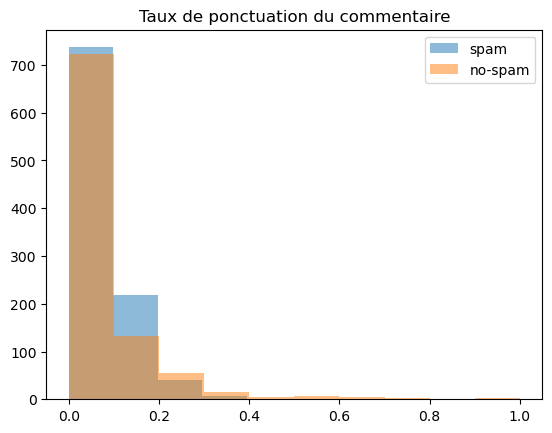

In [86]:
plt.hist(data[data["CLASS"]==1]['PUNCTUATION_RATE'],alpha=0.5,label='spam')

plt.hist(data[data["CLASS"]==0]['PUNCTUATION_RATE'],alpha=0.5,label='no-spam')

plt.legend(loc='upper right')
plt.title('Taux de ponctuation du commentaire')

In [87]:
from sklearn.model_selection import train_test_split
seed=123

In [88]:
X_train,X_test,y_train,y_test=train_test_split(data[['CONTENT','CONTENT_LENGHT','PUNCTUATION_RATE']],data['CLASS'],test_size=0.2,random_state=seed)

In [90]:
X_train.shape,X_test.shape

((1564, 3), (392, 3))

,CONTENT,CONTENT_LENGHT,PUNCTUATION_RATE
229,We pray for you Little Psy ♡﻿,29,0.000000
24,This awesome song needed 4 years to reach to 8...,118,0.010309
98,The rap: cool Rihanna: STTUUPID﻿,36,0.071429
295,Hey dickwad - we&#39;re all africans. The colo...,233,0.078534
163,i am from Brazil please subscribe my channel l...,58,0.000000


In [93]:
vectorizer=CountVectorizer()
X_train_vec=vectorizer.fit_transform(X_train['CONTENT'])
X_test_vec=vectorizer.transform(X_test['CONTENT'])

In [94]:
X_train_vec

<1564x3846 sparse matrix of type '<class 'numpy.int64'>'
	with 20361 stored elements in Compressed Sparse Row format>

In [96]:
len(vectorizer.get_feature_names_out())

3846

In [97]:
X_test_vec

<392x3846 sparse matrix of type '<class 'numpy.int64'>'
	with 4771 stored elements in Compressed Sparse Row format>

In [98]:
rf=RandomForestClassifier(random_state=seed)

In [99]:
rf.fit(X_train_vec,y_train)

RandomForestClassifier(random_state=123)

In [100]:
rf.score(X_test_vec,y_test)

0.9617346938775511

In [103]:
#Construire X_train_vec en data frame pour bien le visualiser 
X_train_content=pd.DataFrame(X_train_vec.toarray(),columns=vectorizer.get_feature_names_out())
X_train_content.head()

,00,000,002,018,034,04,047000,05,053012,0687119038,...,ｃｏｍｍｅｎｔ,ｄａｍｎ,ｅｂａｙ,ｆａｎｃy,ｈｔｔｐ,ｉｓ,ｓｈｏｅｃｏｌｌｅｃｔｏｒ314,ｔｈｉｓ,ｕｓｒ,ｗｗｗ
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [111]:
#On concatne les deux pour avoir la dataframe finale 

X_train_final=pd.concat(
    [X_train[['CONTENT_LENGHT','PUNCTUATION_RATE']].reset_index(drop=True)
                         ,X_train_content],axis=1)  
   
X_train_final.head()

,CONTENT_LENGHT,PUNCTUATION_RATE,00,000,002,018,034,04,047000,05,...,ｃｏｍｍｅｎｔ,ｄａｍｎ,ｅｂａｙ,ｆａｎｃy,ｈｔｔｐ,ｉｓ,ｓｈｏｅｃｏｌｌｅｃｔｏｒ314,ｔｈｉｓ,ｕｓｒ,ｗｗｗ
0,77,0.032787,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,16,0.071429,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,105,0.058824,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,34,0.035714,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,351,0.109929,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [112]:
rf.fit(X_train_final,y_train)

RandomForestClassifier(random_state=123)

## Creation d' une pipeline pour automatiser la tache et reglage de parametre .

In [115]:
data

,COMMENT_ID,AUTHOR,DATE,CONTENT,CLASS,CONTENT_LENGHT,PUNCTUATION_RATE
0,LZQPQhLyRh80UYxNuaDWhIGQYNQ96IuCg-AYWqNPjpU,Julius NM,2013-11-07T06:20:48,"Huh, anyway check out this you[tube] channel: ...",1,56,0.081633
1,LZQPQhLyRh_C2cTtd9MvFRJedxydaVW-2sNg5Diuo4A,adam riyati,2013-11-07T12:37:15,Hey guys check out my new channel and our firs...,1,166,0.066667
2,LZQPQhLyRh9MSZYnf8djyk0gEF9BHDPYrrK-qCczIY8,Evgeny Murashkin,2013-11-08T17:34:21,just for test I have to say murdev.com,1,38,0.032258
3,z13jhp0bxqncu512g22wvzkasxmvvzjaz04,ElNino Melendez,2013-11-09T08:28:43,me shaking my sexy ass on my channel enjoy ^_^ ﻿,1,48,0.078947
4,z13fwbwp1oujthgqj04chlngpvzmtt3r3dw,GsMega,2013-11-10T16:05:38,watch?v=vtaRGgvGtWQ Check this out .﻿,1,39,0.090909
...,...,...,...,...,...,...,...
365,_2viQ_Qnc6-bMSjqyL1NKj57ROicCSJV5SwTrw-RFFA,Katie Mettam,2013-07-13T13:27:39.441000,I love this song because we sing it at Camp al...,0,58,0.043478
366,_2viQ_Qnc6-pY-1yR6K2FhmC5i48-WuNx5CumlHLDAI,Sabina Pearson-Smith,2013-07-13T13:14:30.021000,I love this song for two reasons: 1.it is abou...,0,93,0.039474
367,_2viQ_Qnc6_k_n_Bse9zVhJP8tJReZpo8uM2uZfnzDs,jeffrey jules,2013-07-13T12:09:31.188000,wow,0,3,0.000000
368,_2viQ_Qnc6_yBt8UGMWyg3vh0PulTqcqyQtdE7d4Fl0,Aishlin Maciel,2013-07-13T11:17:52.308000,Shakira u are so wiredo,0,23,0.000000


In [117]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1956 entries, 0 to 369
Data columns (total 7 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   COMMENT_ID        1956 non-null   object 
 1   AUTHOR            1956 non-null   object 
 2   DATE              1711 non-null   object 
 3   CONTENT           1956 non-null   object 
 4   CLASS             1956 non-null   int64  
 5   CONTENT_LENGHT    1956 non-null   int64  
 6   PUNCTUATION_RATE  1956 non-null   float64
dtypes: float64(1), int64(2), object(4)
memory usage: 122.2+ KB


In [118]:
X_train,X_test,y_train,y_test=train_test_split(

data['CONTENT'],data['CLASS'],test_size=0.2,random_state=seed)

In [120]:
X_train.shape,X_test.shape,y_train.shape,y_test.shape

((1564,), (392,), (1564,), (392,))

In [123]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.pipeline import make_pipeline,Pipeline
from sklearn.ensemble import RandomForestClassifier

In [124]:
pipe=make_pipeline(CountVectorizer(),RandomForestClassifier(random_state=seed))

In [125]:
print(pipe)

Pipeline(steps=[('countvectorizer', CountVectorizer()),
                ('randomforestclassifier',
                 RandomForestClassifier(random_state=123))])


In [126]:
#On a tout mis dans un objet pipeline qui devient en lui meme un estimateur ,un gros tuyau qui fait passer le données nca devient un gigantesque modele

In [128]:
pipe_fitted=pipe.fit(X_train,y_train)
pipe

Pipeline(steps=[('countvectorizer', CountVectorizer()),
                ('randomforestclassifier',
                 RandomForestClassifier(random_state=123))])

In [129]:
pipe_fitted.score(X_test,y_test)

0.9617346938775511

In [130]:
#Avec une pipeline ,on peut directement faire une inférence sans beaucoup d'efforts .

In [132]:
pipe_fitted.predict(['What a great video'])

array([0], dtype=int64)

In [133]:
pipe_fitted.predict(['I want to see your body'])

array([0], dtype=int64)

In [134]:
from sklearn.model_selection import cross_val_score

scores=cross_val_score(pipe,X_train,y_train,cv=3
                      )
scores

array([0.94827586, 0.95585413, 0.94241843])

In [138]:
#Reglage des hyperparametres :Competences importantes
parameters={
    'countvectorizer__max_features':(None,1000,2000),
    'countvectorizer__ngram_range':((1,1),(1,2)),
    'countvectorizer__stop_words':(None,'english'),
    'randomforestclassifier__n_estimators':(50,100,200)
}

In [139]:
parameters

{'countvectorizer__max_features': (None, 1000, 2000),
 'countvectorizer__ngram_range': ((1, 1), (1, 2)),
 'countvectorizer__stop_words': (None, 'english'),
 'randomforestclassifier__n_estimators': (50, 100, 200)}

In [141]:
from sklearn.model_selection import GridSearchCV

In [144]:
search_model=GridSearchCV(pipe,parameters,cv=3,n_jobs=-1)

search_model #est un estimateur en lui meme 

GridSearchCV(cv=3,
             estimator=Pipeline(steps=[('countvectorizer', CountVectorizer()),
                                       ('randomforestclassifier',
                                        RandomForestClassifier(random_state=123))]),
             n_jobs=-1,
             param_grid={'countvectorizer__max_features': (None, 1000, 2000),
                         'countvectorizer__ngram_range': ((1, 1), (1, 2)),
                         'countvectorizer__stop_words': (None, 'english'),
                         'randomforestclassifier__n_estimators': (50, 100,
                                                                  200)})

In [145]:
search_model.fit(X_train,y_train)

GridSearchCV(cv=3,
             estimator=Pipeline(steps=[('countvectorizer', CountVectorizer()),
                                       ('randomforestclassifier',
                                        RandomForestClassifier(random_state=123))]),
             n_jobs=-1,
             param_grid={'countvectorizer__max_features': (None, 1000, 2000),
                         'countvectorizer__ngram_range': ((1, 1), (1, 2)),
                         'countvectorizer__stop_words': (None, 'english'),
                         'randomforestclassifier__n_estimators': (50, 100,
                                                                  200)})

In [146]:
print(search_model.best_params_)
print(search_model.best_score_)

{'countvectorizer__max_features': 1000, 'countvectorizer__ngram_range': (1, 2), 'countvectorizer__stop_words': 'english', 'randomforestclassifier__n_estimators': 50}
0.9571655844076256


In [149]:
import joblib

joblib.dump(value=search_model.best_estimator_,filename='detection_de_fraude_modelespam.pkl')

['detection_de_fraude_modelespam.pkl']

In [153]:
#Chargement de mon modele de detection enregistré

mise_production=joblib.load(filename='detection_de_fraude_modelespam.pkl')

In [154]:
mise_production.predict(['I need your credit card for buying a new phone'])

array([1], dtype=int64)

## Projet 4:Analyse de sentiment d'un tweet avec de modele pré-entrainé word2vec et glove

In [12]:
df.head()

,target,ids,date,flag,user,text
0,0,1467810369,Mon Apr 06 22:19:45 PDT 2009,NO_QUERY,_TheSpecialOne_,"@switchfoot http://twitpic.com/2y1zl - Awww, t..."
1,0,1467810672,Mon Apr 06 22:19:49 PDT 2009,NO_QUERY,scotthamilton,is upset that he can't update his Facebook by ...
2,0,1467810917,Mon Apr 06 22:19:53 PDT 2009,NO_QUERY,mattycus,@Kenichan I dived many times for the ball. Man...
3,0,1467811184,Mon Apr 06 22:19:57 PDT 2009,NO_QUERY,ElleCTF,my whole body feels itchy and like its on fire
4,0,1467811193,Mon Apr 06 22:19:57 PDT 2009,NO_QUERY,Karoli,"@nationwideclass no, it's not behaving at all...."


In [13]:
df.target.value_counts(normalize=False)

0    800000
4    800000
Name: target, dtype: int64

In [14]:
#On recupere que les deux colonnes qui m'interessent
#et n'utiliser qu'une partie de données 
date=df.sample(n=30000,random_state=0)[['target','text']]

In [15]:
date.head()

,target,text
557138,0,wants to compete! i want hard competition! i w...
349381,0,It seems we are stuck on the ground in Amarill...
182051,0,where the f are my pinking shears? rarararrrar...
571236,0,0ff t0 tHE MEEtiN.. i HAtE WhEN PPl V0lUNtEER...
1339637,4,@ reply me pls


## Nettoyage des tweets

In [16]:
#Nettoyage de tweet
#Pour manipuler des expressions regulieres
import re
#ponctuations
import string
ponctuations=list(string.punctuation)
print(ponctuations)


['!', '"', '#', '$', '%', '&', "'", '(', ')', '*', '+', ',', '-', '.', '/', ':', ';', '<', '=', '>', '?', '@', '[', '\\', ']', '^', '_', '`', '{', '|', '}', '~']


In [17]:
#tokenisation
import nltk
nltk.download('punkt')


[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\POSTE\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [18]:
from nltk.tokenize import word_tokenize

#Lemmatisation
nltk.download('wordnet')
from nltk.stem import WordNetLemmatizer
lem=WordNetLemmatizer()

#Charger les stopwords
nltk.download('stopwords')
from nltk.corpus import stopwords
mots_vides=stopwords.words('english')
print('\n')
print(mots_vides)



['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've", "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', 'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their', 'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', 'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after', 'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more', 'most', 'other', 'some', 'such', 'no', 'nor', 'not', 'only', 'own', 'same', 'so', 'than',

[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\POSTE\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\POSTE\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [19]:
def clean_tweet(tweet,ponctuations,stopwords,lem):
    #Harmonisation de la classe
    temp=tweet.lower()
    #retirer les contractions en anglais,les mentions ,les @ ,#,de liens web
    temp=re.sub("'","",temp)
    
    #Retrait de la ponctuation
    temp="".join([char for char in list(temp) if not (char in ponctuations)])
    #Retrait des nombres
    
    temp=re.sub("[0-9]","",temp)
    
    #Tokenization
    
    temp=word_tokenize(temp)
    
    #Lemmatisation
    temp=[lem.lemmatize(mot) for mot in temp]
    #Retrai de stopwords
    
    temp=[mot for mot in temp if mot not in stopwords]
    #Retrait de tokens de moins de 3 caracteres
    
    temp=[mot for mot in temp if len(mot)>=3]
    #Reformer la chaine
    
    temp=" ".join(mot for mot in temp)
    
    return temp

In [20]:
#Appliquer le nettoyage au corpus
corpus=list(date.text)
corpus=[clean_tweet(doc,ponctuations,mots_vides,lem) for doc in corpus]

In [192]:
#corpus avant
#corpus

['wants to compete! i want hard competition! i want to rally. i want to feel the power coming out of the engine! i want to compete ',
 'It seems we are stuck on the ground in Amarillo. They have put a ground stop for all flights leaving for Denver. Said updates in an hour ',
 'where the f are my pinking shears? rarararrrarararr...babyproofing while cutting stuff makes me stick shears random places &amp; forget them ',
 '0ff t0 tHE MEEtiN..  i HAtE WhEN PPl V0lUNtEER MY fREE tiME..gRRR!',
 '@ reply me pls ',
 "@bharathy_99: Jazz in India is just Honda strategy to prove they can make affordable cars for the working class. It still doesn't fit me. ",
 'aaaaaaaaaaah, met a boy. he seems nice. im happppppy now ',
 '@jonasbrothers http://twitpic.com/6q1om - Sports Center !!!!! you guys are too legit to quit. Wooww ',
 '@saragarth Not bad, bit grumpy cause of exams but generally OK ta  x',
 "@luke_redroot can't watch it  what is it?",
 'GOOD NITE EVERBODY I HAD A LONG DAY AND DID A PROJECT NO

In [196]:
#corpus apres
corpus

['want compete want hard competition want rally want feel power coming engine want compete',
 'seems stuck ground amarillo put ground stop flight leaving denver said update hour',
 'pinking shear rarararrrarararrbabyproofing cutting stuff make stick shear random place amp forget',
 'meetin hate ppl vlunteer free timegrrr',
 'reply pls',
 'bharathy jazz india honda strategy prove make affordable car working class still doesnt fit',
 'aaaaaaaaaaah met boy seems nice happppppy',
 'jonasbrothers httptwitpiccomqom sport center guy legit quit wooww',
 'saragarth bad bit grumpy cause exam generally',
 'lukeredroot cant watch',
 'good nite everbody long day project finally time get rest peace',
 'morning twitter world gon start day coldest lucozade find',
 'jonascool hahaa thats really random',
 'angries theyre awesome wan record one thennnn recording studio haha bruce record people',
 'forcei wolff participar twitter',
 'kutnerrrr think still show ugh kutnerkal penn youve bright star',
 'jhon

In [21]:
#Nouveau dataframe

DC=pd.DataFrame({'target':(date.target==4).astype('int32'),'tweet':corpus})

In [22]:
#Apres
DC

,target,tweet
557138,0,want compete want hard competition want rally ...
349381,0,seems stuck ground amarillo put ground stop fl...
182051,0,pinking shear rarararrrarararrbabyproofing cut...
571236,0,meetin hate ppl vlunteer free timegrrr
1339637,1,reply pls
...,...,...
39763,0,johnackley clean
664616,0,ashleytisdale wish could see white amp boom
97313,0,really going miss jonasbrothers junei want mee...
1084204,1,jonfolse theyre coach anddddd best part buck


In [23]:
#Avant
date

,target,text
557138,0,wants to compete! i want hard competition! i w...
349381,0,It seems we are stuck on the ground in Amarill...
182051,0,where the f are my pinking shears? rarararrrar...
571236,0,0ff t0 tHE MEEtiN.. i HAtE WhEN PPl V0lUNtEER...
1339637,4,@ reply me pls
...,...,...
39763,0,@johnackley Clean Me!
664616,0,@ashleytisdale i wish i could see you at white...
97313,0,I'm really going to miss @jonasbrothers 15th J...
1084204,4,@JonFolse they're coach! anddddd the best part...


In [24]:
#Retrait de tweet ou il y a plus rien
print(DC.loc[DC.tweet==''].shape[0])

10


In [25]:
final=DC.loc[DC.tweet!= '']
final.shape

(29990, 2)

## Analyse des sentiments _Modelisation predictive

In [26]:
#Subdivision apprentissae_test des données 
from sklearn.model_selection import train_test_split
dfTrain,dfTest=train_test_split(final,train_size=0.7,random_state=0)

In [27]:
train_test_split

<function sklearn.model_selection._split.train_test_split(*arrays, test_size=None, train_size=None, random_state=None, shuffle=True, stratify=None)>

In [28]:
#Verification

print(dfTrain.shape)
print(dfTest.shape)

(20993, 2)
(8997, 2)


In [29]:
import tensorflow as tf

In [43]:
#pip list:Permet de voir les librairies installées sur python

In [37]:
import keras
print(keras.__version__)
from tensorflow import keras

3.5.0


## Tokenisation avec keras:constitution du dictionnaires

In [53]:
#Tokenisation avec keras
#nim_words=None=>sans limitation du nombre de termes à extraire
from tensorflow.keras.preprocessing.text import Tokenizer

tk=Tokenizer(num_words=None)

#Creation d'un dictionnaires à partir des documents
#de l'echantillon d'apprentissage
tk.fit_on_texts(dfTrain.tweet)

#Nombre de documents traités
print(tk.document_count)

20993


In [56]:
#taille du dictionnaire
dico_size=len(tk.word_counts)
dico_size

31287

In [59]:
#Liste des termes avec leur indice-les 10 premiers
print(list(tk.word_index.items())[:30])

#Le dictionnaire est toujours crée sur l'echantillon d'apprentissage et jamais sur la totalité

[('day', 1), ('good', 2), ('get', 3), ('like', 4), ('got', 5), ('love', 6), ('dont', 7), ('going', 8), ('work', 9), ('today', 10), ('cant', 11), ('time', 12), ('back', 13), ('know', 14), ('one', 15), ('lol', 16), ('really', 17), ('see', 18), ('want', 19), ('well', 20), ('still', 21), ('need', 22), ('night', 23), ('think', 24), ('new', 25), ('home', 26), ('amp', 27), ('thanks', 28), ('feel', 29), ('last', 30)]


## Documents=Séquences de tokens

In [64]:
#Pour utiliser la couche Embledding,il faut transformer les documents en uune séquence de Tokens
#Organisation de la matrice de données 

In [62]:
seqTrain=tk.texts_to_sequences(dfTrain.tweet)

print(seqTrain[:5])

[[372, 406, 1, 412, 269, 714, 66, 7948, 3, 2506, 7949, 3, 978, 650], [204, 121, 17, 46], [197, 7950, 7951, 315, 1602, 914, 2, 12, 2, 12], [1113, 1733, 2258, 5184, 2042, 1066, 2043, 7952, 173], [7953, 97, 5185, 180, 3319, 99, 216, 1228, 301, 36, 93, 164, 2044]]


In [66]:
#On voit que le premier document qui est le premier tweet
#est representé par la premiere matrice divisé en 8 tokens 
#Tweet correspondant
print(dfTrain.tweet[:5])

1099794    lovely sunny day walk dad shop gon romford get...
644584                                  head hurt really bad
477671     found quotaswsutc vpquot name tag tear good ti...
54395      serious thunderstorm tornado warning rolling n...
1334260    mizzmag hey mizz saw veronica thought might in...
Name: tweet, dtype: object


In [69]:
#Longueur max des documents dans l'échantillon train
import numpy as np

max_lenght=np.max(np.array([len(doc) for doc in seqTrain]))
max_lenght

21

In [65]:
#Le probleme de cette reprensation,elles sont de longueur variables 
#Il faut tout mettre les matrices sur une meme longueur
#On recupere le document le plus long.

#Transform en pad_sequencespour
#manipuler une structure de taille fixe
#maxlen=max_lenght+marge pour eventuellemnt gerer les docq les plus longs en deploiement 


In [73]:
#Vu qu'on connait pas la longueur du document de l'ech test,on prend une marge de 5
#marge_lenght

marge_lenght=5

from tensorflow.keras.preprocessing.sequence import pad_sequences

padTrain=pad_sequences(seqTrain,maxlen=max_lenght+marge_lenght,padding='post')

In [75]:
#Les trois premiers documents
print(padTrain[:3,:])

[[ 372  406    1  412  269  714   66 7948    3 2506 7949    3  978  650
     0    0    0    0    0    0    0    0    0    0    0    0]
 [ 204  121   17   46    0    0    0    0    0    0    0    0    0    0
     0    0    0    0    0    0    0    0    0    0    0    0]
 [ 197 7950 7951  315 1602  914    2   12    2   12    0    0    0    0
     0    0    0    0    0    0    0    0    0    0    0    0]]


## Chargement de la représentation pré entrainé de Glove

In [80]:
#La representation pré entrai de glove
#Structure dictionnaires pour stocker les couples
#termes,vecteurs
embeddings_index={}
#ouvrir le fichier en lecture dim=50
f=open('./glove.6B/glove.6B.50d.txt','r',encoding='utf-8')

#lire ligne par ligne et decomposer

for line in f :
    word,coefs=line.split(maxsplit=1)
    coefs=np.fromstring(coefs,"f",sep=' ')
    embeddings_index[word]=coefs
    
#fermer le fichier
f.close()

In [84]:
#Verification du nombre de termes
print('Found %s word vectors.' % len(embeddings_index))

Found 400000 word vectors.


In [85]:
#Coordonnées des 3 premiers termes

print(list(embeddings_index.items())[:3])

[('the', array([ 4.1800e-01,  2.4968e-01, -4.1242e-01,  1.2170e-01,  3.4527e-01,
       -4.4457e-02, -4.9688e-01, -1.7862e-01, -6.6023e-04, -6.5660e-01,
        2.7843e-01, -1.4767e-01, -5.5677e-01,  1.4658e-01, -9.5095e-03,
        1.1658e-02,  1.0204e-01, -1.2792e-01, -8.4430e-01, -1.2181e-01,
       -1.6801e-02, -3.3279e-01, -1.5520e-01, -2.3131e-01, -1.9181e-01,
       -1.8823e+00, -7.6746e-01,  9.9051e-02, -4.2125e-01, -1.9526e-01,
        4.0071e+00, -1.8594e-01, -5.2287e-01, -3.1681e-01,  5.9213e-04,
        7.4449e-03,  1.7778e-01, -1.5897e-01,  1.2041e-02, -5.4223e-02,
       -2.9871e-01, -1.5749e-01, -3.4758e-01, -4.5637e-02, -4.4251e-01,
        1.8785e-01,  2.7849e-03, -1.8411e-01, -1.1514e-01, -7.8581e-01],
      dtype=float32)), (',', array([ 0.013441,  0.23682 , -0.16899 ,  0.40951 ,  0.63812 ,  0.47709 ,
       -0.42852 , -0.55641 , -0.364   , -0.23938 ,  0.13001 , -0.063734,
       -0.39575 , -0.48162 ,  0.23291 ,  0.090201, -0.13324 ,  0.078639,
       -0.41634 , -0.1

In [86]:
#Coordonées de 'good'
print(embeddings_index["good"])

[-3.5586e-01  5.2130e-01 -6.1070e-01 -3.0131e-01  9.4862e-01 -3.1539e-01
 -5.9831e-01  1.2188e-01 -3.1943e-02  5.5695e-01 -1.0621e-01  6.3399e-01
 -4.7340e-01 -7.5895e-02  3.8247e-01  8.1569e-02  8.2214e-01  2.2220e-01
 -8.3764e-03 -7.6620e-01 -5.6253e-01  6.1759e-01  2.0292e-01 -4.8598e-02
  8.7815e-01 -1.6549e+00 -7.7418e-01  1.5435e-01  9.4823e-01 -3.9520e-01
  3.7302e+00  8.2855e-01 -1.4104e-01  1.6395e-02  2.1115e-01 -3.6085e-02
 -1.5587e-01  8.6583e-01  2.6309e-01 -7.1015e-01 -3.6770e-02  1.8282e-03
 -1.7704e-01  2.7032e-01  1.1026e-01  1.4133e-01 -5.7322e-02  2.7207e-01
  3.1305e-01  9.2771e-01]


In [88]:
#Coordonées de nice
print(embeddings_index["nice"])

[ 0.20189   0.80606  -1.1281   -0.59593   0.52756  -0.4769   -0.5264
  0.14526  -0.86087   0.56199  -0.43708  -0.16586  -0.23328  -0.21726
  0.52114   0.062307  0.55115  -0.18002  -0.32983  -0.94434  -0.62019
  0.78764  -0.36133   0.6858    0.3791   -0.87744  -0.76792   1.2885
  1.142    -0.73489   2.3932    1.0967   -0.48686   0.5284    0.3927
 -0.056427  0.29632   1.0798    0.45157  -0.98115   1.0037    0.15634
  0.022584 -0.14832  -0.092933  0.33691   0.42171  -0.21642   1.0139
  1.0535  ]


In [91]:
#Verifier si ils apparaissent dans le meme document en termes de signification et de distance
#La similarité cosinus , dans son voisine immediat
import scipy

print(1.0-scipy.spatial.distance.cosine(embeddings_index["good"],embeddings_index["nice"]))

0.7958537936210632
